# Simulation Analysis (Toy Network)

In [151]:
from gurobipy import Model, GRB
import numpy as np
import pandas as pd

def optimize_network(p_w, R_min, d, K, C, m_hops, l_max, alpha):
    m = Model("5G_Network_Optimization")

    # Decision variables
    y = m.addVar(vtype=GRB.BINARY, name="y")
    l = m.addVar(name="l")
    r = m.addVar(name="r")
    
    # Constraints
    m.addConstr(l == (1 + y) * m_hops * (K + d) / C, name="Loading")
    base_reliability = (1 - p_w) * (1 - 0) * (1 - 0)  # p_t1 and p_t2 set to zero as shown
    m.addConstr(r == (1 - y) * base_reliability + y * (1 - (1 - base_reliability)**2), name="Reliability")
    m.addConstr(l <= l_max, name="MaxLoading")
    m.addConstr(r >= R_min, name="MinReliability")

    #### Set objective
    m.setObjective(alpha * l - (1 - alpha) * r, GRB.MINIMIZE)

    # Optimize the model
    m.optimize()

    if m.status == GRB.OPTIMAL:
        return [p_w, y.X, l.X, r.X, m.objVal]
    else:
        return [p_w, None, None, None, None]
    


def optimize_network_re(p_w, R_min, d, K, C, m_hops, l_max):

    m = Model("5G_Network_Optimization_Linearized")
    
    # Decision variables
    y = m.addVar(vtype=GRB.BINARY, name="y")
    l = m.addVar(name="l")
    r = m.addVar(name="r")
    z = m.addVar(name="z")  # Auxiliary variable for linearization
    
    # Constraints
    m.addConstr(l == (1 + y) * m_hops * (K + d) / C, name="Loading")
    base_reliability = (1 - p_w) * (1 - 0) * (1 - 0)  # Assuming p_t1 and p_t2 are zero
    m.addConstr(r == (1 - y) * base_reliability + y * (1 - (1 - base_reliability)**2), name="Reliability")
    m.addConstr(l <= l_max, name="MaxLoading")
    m.addConstr(r >= R_min, name="MinReliability")

    # Adding constraints to optimize the ratio
    m.addConstr(z * l <= r, name="RatioConstraint")  # z <= r / l

    # Set objective to maximize z, which is indirectly maximizing r / l
    m.setObjective(z, GRB.MAXIMIZE)

    # Optimize the model
    m.optimize()

    if m.status == GRB.OPTIMAL:
        return [p_w, y.X, l.X, r.X, z.X]
    else:
        return [p_w, None, None, None, None]

## Loop for a given $R_{min}$

In [152]:
# Usage
# Constants and parameters
p_t1 = 0  # Slightly adjusted for demonstration
p_t2 = 0  # Slightly adjusted for demonstration
d = 1     # Data size per packet
K = 0     # Fixed overhead
C = 6
m_hops = 3  # Number of hops
l_max = 1
alpha = 0.5

R_min_values = np.arange(0, 1.0, 0.05)
R_min_values = np.append(R_min_values, 0.99)
all_results = []
for R_min in R_min_values:
    p_w_max = np.sqrt(1 - R_min)
    p_w_values = np.arange(0, p_w_max + 0.05, 0.05)
    p_w_values = p_w_values[p_w_values <= p_w_max]
    for idx, p_w in enumerate(p_w_values):
        result = optimize_network(p_w, R_min, d, K, C, m_hops, l_max, alpha)
        all_results.append([R_min, idx] + result)  


# Convert results to DataFrame and save to CSV
df = pd.DataFrame(all_results, columns=['R_min', 'condition_k', 'p_w_k', 'y_k', 'l_k', 'r_k', 'obj_k'])
df.to_csv('res_Rmin.csv', index=False)
print("Results saved to 'res_Rmin.csv'")

Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (win64 - Windows 10.0 (19045.2))

CPU model: 11th Gen Intel(R) Core(TM) i5-1145G7 @ 2.60GHz, instruction set [SSE2|AVX|AVX2|AVX512]
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 4 rows, 3 columns and 5 nonzeros
Model fingerprint: 0x8222f3a6
Variable types: 2 continuous, 1 integer (1 binary)
Coefficient statistics:
  Matrix range     [5e-01, 1e+00]
  Objective range  [5e-01, 5e-01]
  Bounds range     [1e+00, 1e+00]
  RHS range        [5e-01, 1e+00]
Presolve removed 4 rows and 3 columns
Presolve time: 0.00s
Presolve: All rows and columns removed

Explored 0 nodes (0 simplex iterations) in 0.01 seconds (0.00 work units)
Thread count was 1 (of 8 available processors)

Solution count 1: -0.25 

Optimal solution found (tolerance 1.00e-04)
Best objective -2.500000000000e-01, best bound -2.500000000000e-01, gap 0.0000%
Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (win64 - Windows 10.0 (190

## RE - Loop for a given $R_{min}$

In [175]:
# Usage
# Constants and parameters
p_t1 = 0  # Slightly adjusted for demonstration
p_t2 = 0  # Slightly adjusted for demonstration
d = 1     # Data size per packet
K = 0     # Fixed overhead
C = 6
m_hops = 3  # Number of hops
l_max = 1

R_min_values = np.arange(0, 1.0, 0.05)
R_min_values = np.append(R_min_values, 0.99)
all_results = []
for R_min in R_min_values:
    p_w_max = np.sqrt(1 - R_min)
    p_w_values = np.arange(0, p_w_max + 0.05, 0.05)
    p_w_values = p_w_values[p_w_values <= p_w_max]
    for idx, p_w in enumerate(p_w_values):
        result = optimize_network_re(p_w, R_min, d, K, C, m_hops, l_max)
        all_results.append([R_min, idx] + result)  


# Convert results to DataFrame and save to CSV
df = pd.DataFrame(all_results, columns=['R_min', 'condition_k', 'p_w_k', 'y_k', 'l_k', 'r_k', 'obj_k'])
df.to_csv('res_Rmin.csv', index=False)
print("Results saved to 'res_Rmin.csv'")

Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (win64 - Windows 10.0 (19045.2))

CPU model: 11th Gen Intel(R) Core(TM) i5-1145G7 @ 2.60GHz, instruction set [SSE2|AVX|AVX2|AVX512]
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 4 rows, 4 columns and 5 nonzeros
Model fingerprint: 0x9aee2ea3
Model has 1 quadratic constraint
Variable types: 3 continuous, 1 integer (1 binary)
Coefficient statistics:
  Matrix range     [5e-01, 1e+00]
  QMatrix range    [1e+00, 1e+00]
  QLMatrix range   [1e+00, 1e+00]
  Objective range  [1e+00, 1e+00]
  Bounds range     [1e+00, 1e+00]
  RHS range        [5e-01, 1e+00]
Presolve removed 4 rows and 4 columns
Presolve time: 0.00s
Presolve: All rows and columns removed

Explored 0 nodes (0 simplex iterations) in 0.01 seconds (0.00 work units)
Thread count was 1 (of 8 available processors)

Solution count 1: 2 

Optimal solution found (tolerance 1.00e-04)
Best objective 2.000000000000e+00, best bound 2.0000000000

## Looping for alpha

In [173]:
# Usage
# Constants and parameters
p_t1 = 0  # Slightly adjusted for demonstration
p_t2 = 0  # Slightly adjusted for demonstration
d = 1     # Data size per packet
K = 0     # Fixed overhead
C = 6
m_hops = 3  # Number of hops
l_max = 1

R_min = 0.2
p_w_max = np.sqrt(1 - R_min)
p_w_values = np.arange(0, p_w_max + 0.05, 0.05)
p_w_values = p_w_values[p_w_values <= p_w_max]

# Varying alpha values
alpha_values = np.linspace(0, 1, 11)  # Creates 11 values from 0 to 1 inclusively


all_results = []
for alpha in alpha_values:
    for idx, p_w in enumerate(p_w_values):
        result = optimize_network(p_w, R_min, d, K, C, m_hops, l_max, alpha)
        all_results.append([alpha, idx] + result)  

# Convert results to DataFrame and save to CSV
columns = ['alpha', 'condition_k', 'p_w_k', 'y_k', 'l_k', 'r_k', 'obj_k']
df = pd.DataFrame(all_results, columns=columns)
df.to_csv('res_alpha.csv', index=False)
print("Results saved to 'res_alpha.csv'")

Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (win64 - Windows 10.0 (19045.2))

CPU model: 11th Gen Intel(R) Core(TM) i5-1145G7 @ 2.60GHz, instruction set [SSE2|AVX|AVX2|AVX512]
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 4 rows, 3 columns and 5 nonzeros
Model fingerprint: 0x6f56956c
Variable types: 2 continuous, 1 integer (1 binary)
Coefficient statistics:
  Matrix range     [5e-01, 1e+00]
  Objective range  [1e+00, 1e+00]
  Bounds range     [1e+00, 1e+00]
  RHS range        [2e-01, 1e+00]
Presolve removed 4 rows and 3 columns
Presolve time: 0.00s
Presolve: All rows and columns removed

Explored 0 nodes (0 simplex iterations) in 0.01 seconds (0.00 work units)
Thread count was 1 (of 8 available processors)

Solution count 1: -1 

Optimal solution found (tolerance 1.00e-04)
Best objective -1.000000000000e+00, best bound -1.000000000000e+00, gap 0.0000%
Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (win64 - Windows 10.0 (19045.

# Results

## Replication Efficiency

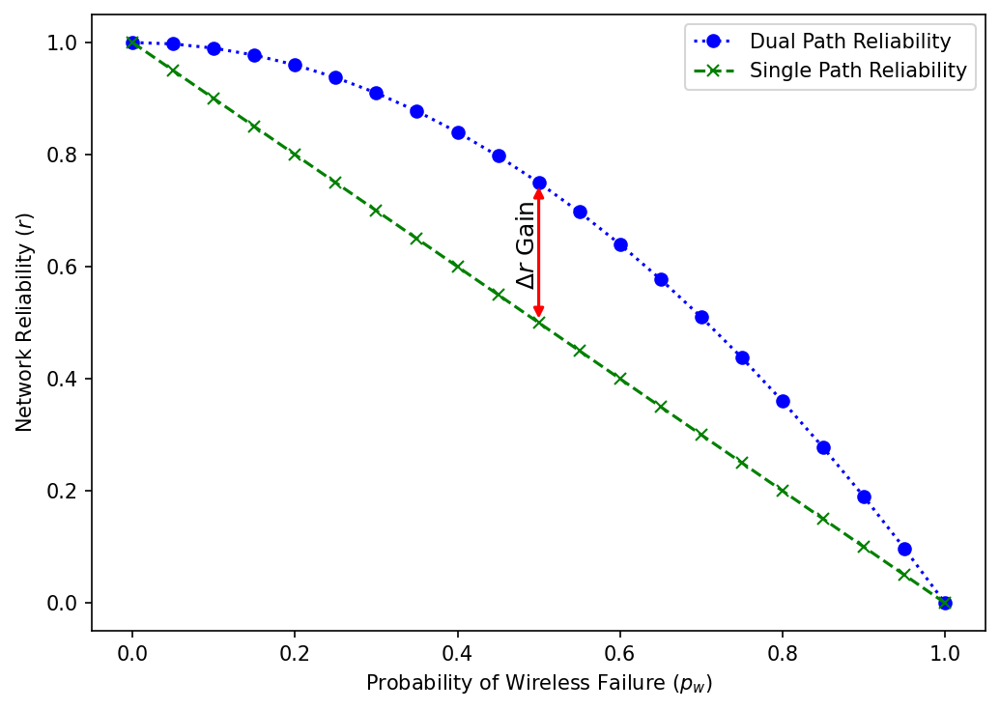

In [88]:
import numpy as np
import matplotlib.pyplot as plt

# Define the probability range for p_w
p_w = np.arange(0, 1.0+0.05, 0.05)

# Define probabilities p_t1 and p_t2 (seem to be fixed at 0 in your example)
p_t1 = 0
p_t2 = 0

# Calculate r_i_onepath
r_i_onepath = (1 - p_w) * (1 - p_t1) * (1 - p_t2)

# Calculate r_i_twopaths
r_i_twopaths = 1 - (1 - (1 - p_w) * (1 - p_t1) * (1 - p_t2))**2


# Choose a p_w value for the intersection and delta calculation, e.g., p_w = 0.5
p_w_intersect = 0.5
index = np.argmin(np.abs(p_w - p_w_intersect))
gain = r_i_twopaths[index] - r_i_onepath[index]



# Plotting
plt.figure(figsize=(7, 5), dpi=150)
plt.plot(p_w, r_i_twopaths, label='Dual Path Reliability', color='b', linestyle=':', marker='o')
plt.plot(p_w, r_i_onepath, label='Single Path Reliability', color='g', linestyle='--', marker='x')


#plt.axvline(p_w_intersect, color='gray', linestyle='dotted', linewidth=1)

# plt.annotate(f'$\Delta={gain:.2f}$', (p_w_intersect, (r_i_twopaths[index] + r_i_onepath[index]) / 2.2),
#              textcoords="offset points", xytext=(0,10), ha='center')


# Add arrow annotation
plt.annotate('', xy=(p_w_intersect, r_i_twopaths[index]), xytext=(p_w_intersect, r_i_onepath[index]),
             arrowprops=dict(arrowstyle="<|-|>", lw=1.5, color='red'))


# # Add vertical delta annotation
# plt.text(p_w_intersect, (r_i_twopaths[index] + r_i_onepath[index]) / 2, f'$\Delta={gain:.2f}$',
#          rotation=90, va='center', ha='right', color='k', fontsize=12)



# Add vertical delta annotation
plt.text(p_w_intersect, (r_i_twopaths[index] + r_i_onepath[index]) / 1.96, f'$\Delta r$ Gain',
         rotation=90, va='center', ha='right', color='k', fontsize=12)



#plt.title('Comparison of r_i_onepath and r_i_twopaths')
plt.xlabel('Probability of Wireless Failure ($p_w$)')
plt.ylabel('Network Reliability ($r$)')
plt.legend()
plt.tight_layout()
plt.savefig("./PDFs/Dual_Single_Path_Reliability.pdf")
plt.show()



In [1]:
from typing import Dict, List

def compute_network_reliability(paths: Dict[int, List[float]]) -> float:
    """
    Computes the network reliability r_{1+n-paths} for a 5G-TSN/DetNet system
    with (1+n) independent paths, each with m segments.

    Args:
        paths: A dictionary where each key is the path index i,
               and each value is a list of segment failure probabilities [p_{i1}, p_{i2}, ..., p_{im}].

    Returns:
        The overall network reliability r_{1+n-paths}.
    """
    path_failure_probs = []

    for i, segment_failures in paths.items():
        # Compute reliability of the i-th path: r_{i-path}
        r_i = 1.0
        for p_ij in segment_failures:
            r_i *= (1 - p_ij)
        
        # Probability of path i failing
        p_i = 1 - r_i
        path_failure_probs.append(p_i)

    # Compute probability that all paths fail simultaneously
    p_all_fail = 1.0
    for p_i in path_failure_probs:
        p_all_fail *= p_i

    # Final network reliability: at least one path succeeds
    r_network = 1 - p_all_fail

    return r_network


# Example usage:
example_paths = {
    1: [0.5, 0, 0],  # Path 1: wireless + 2 wireline segments
    2: [0.5, 0, 0]   # Path 2: wireless + 2 wireline segments
}

r_1n_paths = compute_network_reliability(example_paths)
print(f"Network reliability (r_{{1+n-paths}}): {r_1n_paths:.6f}")


Network reliability (r_{1+n-paths}): 0.750000


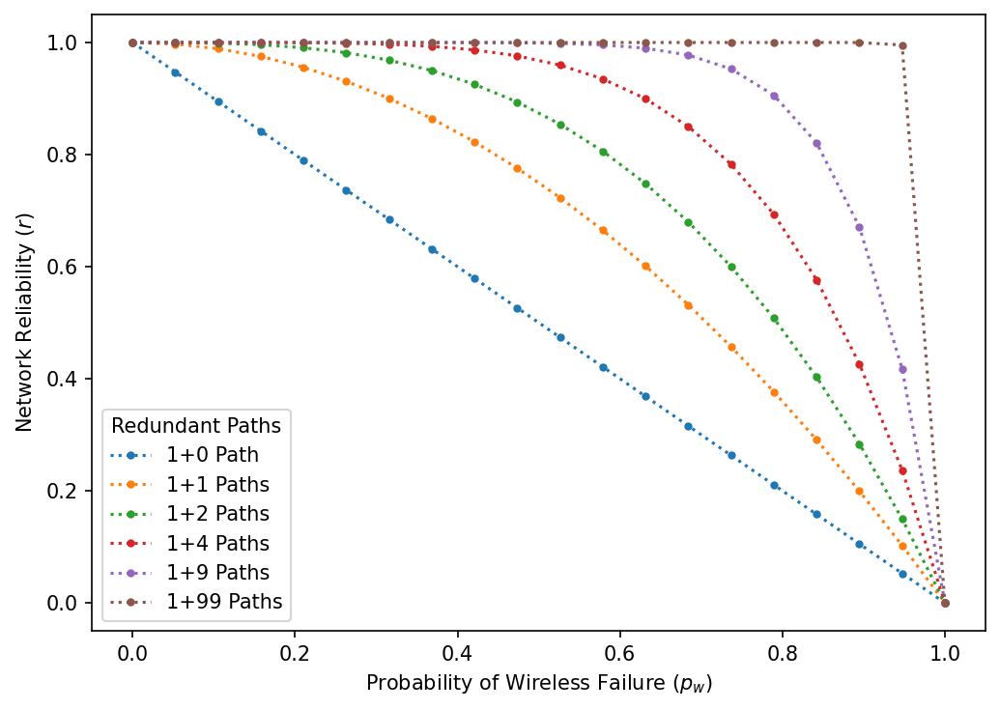

In [25]:
import numpy as np
import matplotlib.pyplot as plt
import csv

# Parameters
p_wireline_1 = 0.0  # Assume no failure for wireline segments
p_wireline_2 = 0.0
m = 3  # Total segments per path: 1 wireless + 2 wireline

# X-axis: wireless failure probability
p_w_values = np.linspace(0, 1, 20)

# Different redundancy levels n = 1, 2, 3, 5, 10
redundant_paths = [1, 2, 3, 5, 10, 100]

# Prepare CSV header
csv_header = ['p_w'] + [f'1+{n-1}_Paths' for n in redundant_paths]
csv_rows = []

# Plot setup
plt.figure(figsize=(7, 5), dpi=150)
# Compute and plot for each n
for n in redundant_paths:
    reliabilities = []
    for p_w in p_w_values:
        paths = {}
        for i in range(1, n+1):
            paths[i] = [p_w, p_wireline_1, p_wireline_2]
        r = compute_network_reliability(paths)
        reliabilities.append(r)
    plt.plot(p_w_values, reliabilities, label=f'1+{n-1} Path{"s" if n > 1 else ""}',linestyle=':', marker='o',markersize=3)
    
    # Add results to CSV rows
    if not csv_rows:
        # Initialize rows if empty
        csv_rows = [[p_w] for p_w in p_w_values]
    for idx, r_val in enumerate(reliabilities):
        csv_rows[idx].append(r_val)
        
        
# Labels and export
plt.xlabel('Probability of Wireless Failure ($p_w$)')
plt.ylabel('Network Reliability ($r$)')
# plt.title('Effect of Redundant Paths on Network Reliability')
plt.legend(title='Redundant Paths')
plt.tight_layout()
plt.savefig("./Network_Reliability_vs_Paths.pdf")
plt.show()

with open('Network_Reliability_vs_Paths.csv', mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(csv_header)
    writer.writerows(csv_rows)


C:\Users\emohaub\AppData\Local\Temp\ipykernel_88656\4045227544.py:11: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


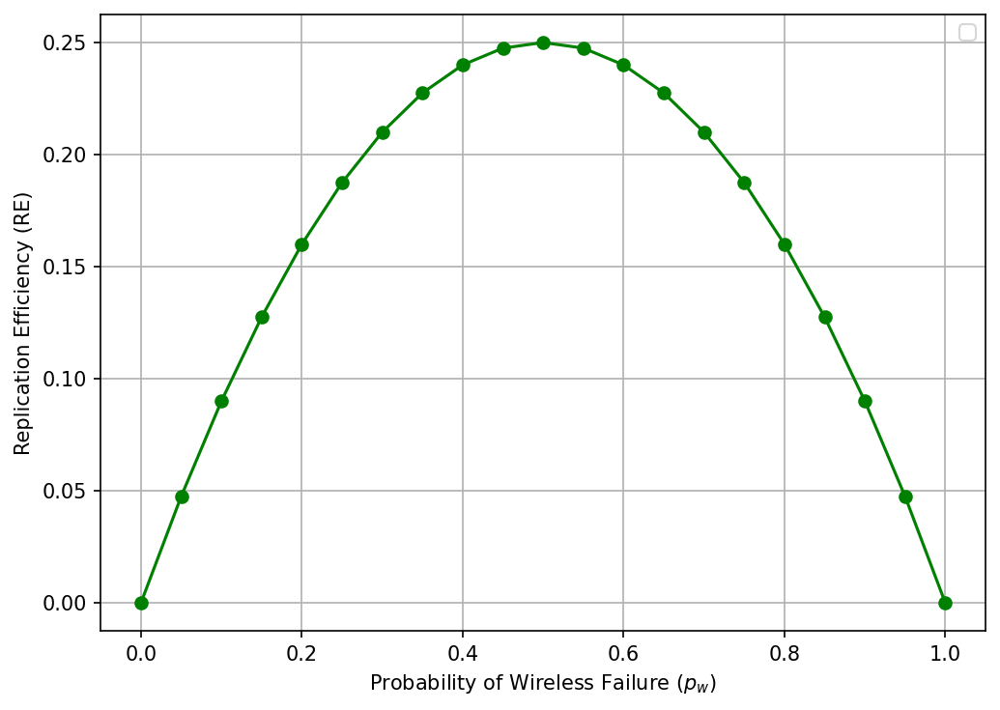

In [89]:
# Calculate the difference
difference = r_i_twopaths - r_i_onepath
# K=0, and d = 1. So this difference is the RE
# Plotting the difference
plt.figure(figsize=(7, 5), dpi=150)
plt.plot(p_w, difference, marker='o', linestyle='-', color='green')
# plt.title('Difference Between Dual Path and Single Path Reliability vs Probability p_w')
plt.xlabel('Probability of Wireless Failure ($p_w$)')
plt.ylabel('Replication Efficiency (RE)')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.savefig("./PDFs/ReplicationEfficiency.pdf")
plt.show()



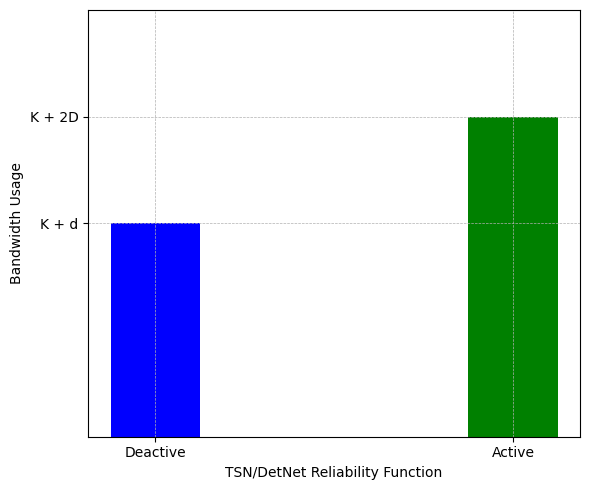

In [90]:
import matplotlib.pyplot as plt

# Constants and Variables
K = 1
y = [0, 1]  # y_i can be 0 or 1
d = 1  # D_i is constant at 1

# Network conditions labels
conditions = ['Deactive', 'Active']

# Calculate bandwidth usage
b = [K + (1 + yi) * d for yi in y]

# Plotting
plt.figure(figsize=(6, 5))
bars = plt.bar(conditions, b, color=['blue', 'green'], width=0.25)

# Customize Y-axis with symbols
plt.yticks(b, [f'K + d' if yi == 0 else f'K + 2D' for bi, yi in zip(b, y)])
plt.xlabel('TSN/DetNet Reliability Function')
plt.ylabel('Bandwidth Usage')
# plt.title('Bandwidth Usage under Different Network Conditions')
plt.ylim(0, max(b) + 1)  # Giving some space above the highest bar
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.savefig("./PDFs/BandwidthUsage.pdf")
plt.show()


## Results $R_{min}$

### Activation Binary Decision

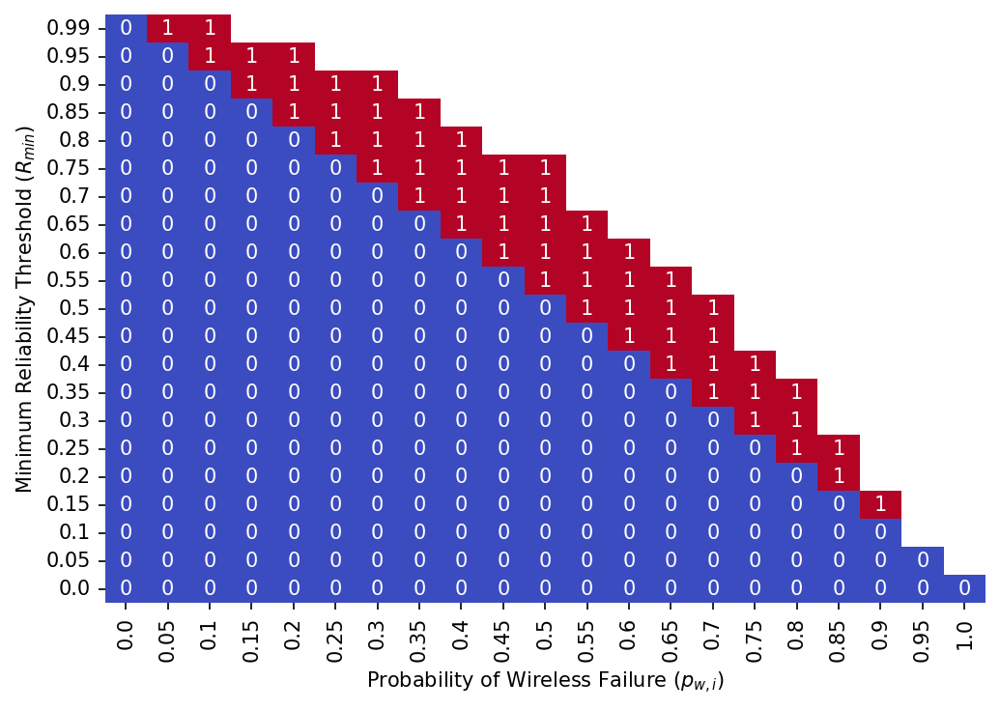

In [153]:
# Create a heatmap showing the values of y_i (binary decision) across Different $R_{min}$ and $p_w$. 
# This visualization can help understand at what points the model chooses to switch the decision variable (from 0 to 1).

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv('res_Rmin.csv')

# Round the values of p_w_k and R_min to the nearest two decimal places
df['p_w_k'] = df['p_w_k'].round(2)
df['R_min'] = df['R_min'].round(2)

# Create a pivot table with `R_min` as rows, `p_w_k` as columns, and `y_i` as values
heatmap_data = df.pivot_table(index='R_min', columns='p_w_k', values='y_k', aggfunc='first')

# Sort the index in descending order to reverse the order on the R_min axis
heatmap_data = heatmap_data.sort_index(ascending=False)

# Plotting the heatmap
plt.figure(figsize=(7, 5), dpi=150)
# sns.heatmap(heatmap_data, annot=True, cmap='coolwarm', fmt=".0f")
sns.heatmap(heatmap_data, annot=True, cmap='coolwarm', fmt=".0f", cbar=False)  # `cbar=False` hides the color bar
# plt.title('Heatmap of Decision Variable ($y_i$) Across Different $R_{min}$ and $p_w$')
plt.xlabel('Probability of Wireless Failure ($p_w$)')
plt.ylabel('Minimum Reliability Threshold ($R_{min}$)')
plt.tight_layout()
plt.savefig("./PDFs/Heatmap_BinaryDecision.pdf")
plt.show()



### Network Reliability

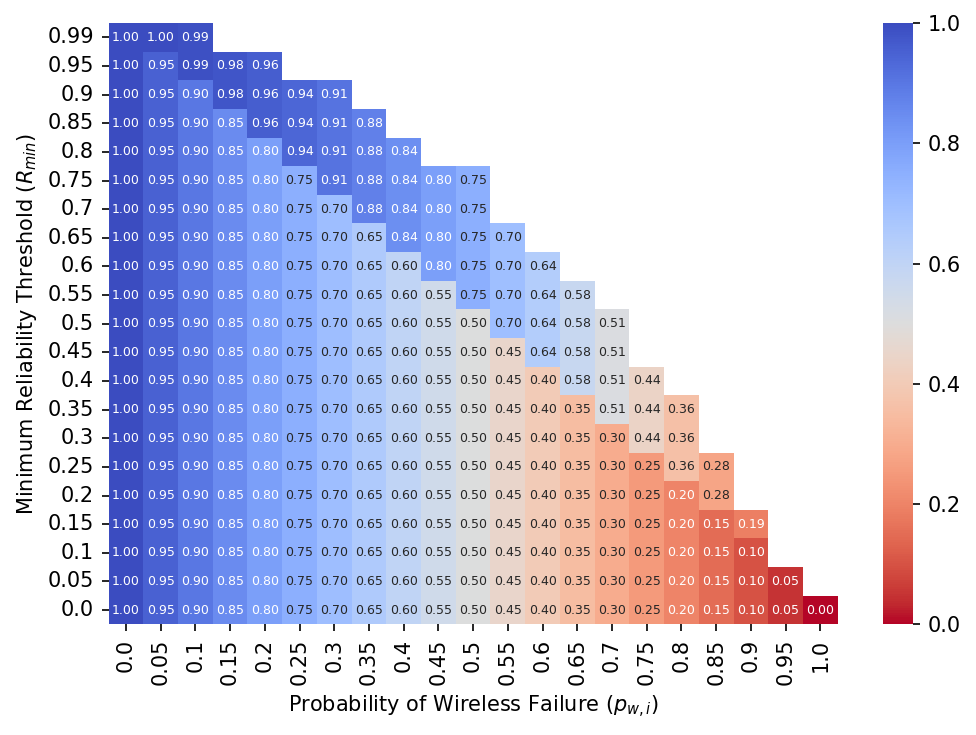

In [154]:
# Create a heatmap showing the values of r_k across Different $R_{min}$ and $p_w$.

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv('res_Rmin.csv')

# Round the values of p_w_k and R_min to the nearest two decimal places
df['p_w_k'] = df['p_w_k'].round(2)
df['R_min'] = df['R_min'].round(2)

# Create a pivot table with `R_min` as rows, `p_w_k` as columns, and `r_k` as values
heatmap_data = df.pivot_table(index='R_min', columns='p_w_k', values='r_k', aggfunc='first')

# Sort the index in descending order to reverse the order on the R_min axis
heatmap_data = heatmap_data.sort_index(ascending=False)

# Plotting the heatmap
plt.figure(figsize=(7, 5), dpi=150)
sns.heatmap(heatmap_data, annot=True, cmap='coolwarm_r', fmt=".2f",annot_kws={"size": 6})
#plt.title('Heatmap of Reliability ($r_k$) Across Different $R_{min}$ and $p_w$')
plt.xlabel('Probability of Wireless Failure ($p_w$)')
plt.ylabel('Minimum Reliability Threshold ($R_{min}$)')
plt.tight_layout()
plt.savefig("./PDFs/Heatmap_Reliability.pdf")
plt.show()



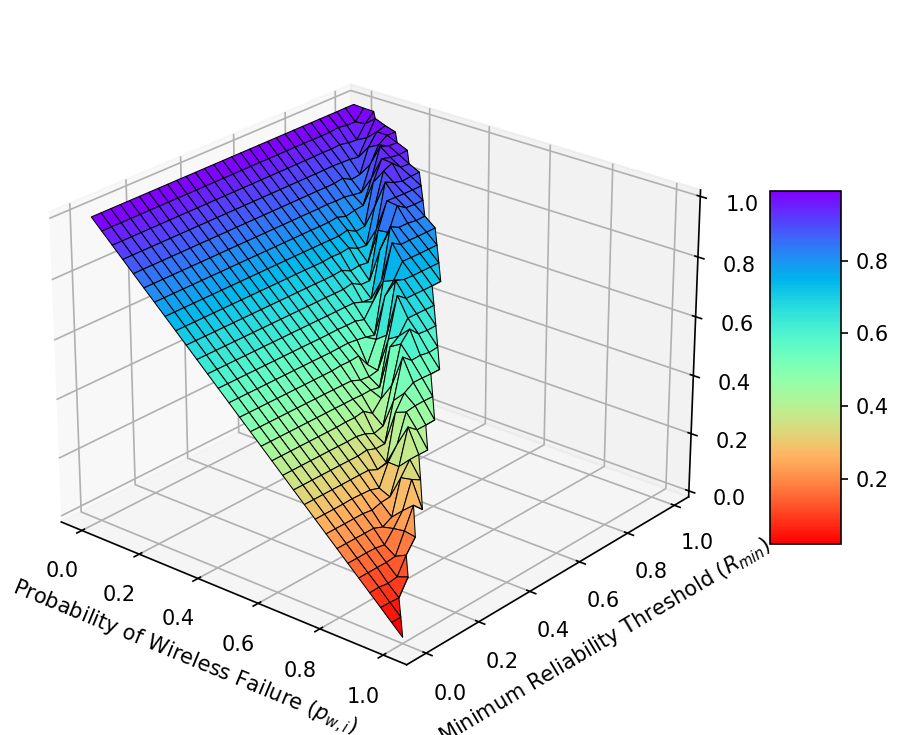

In [146]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.interpolate import griddata

# Load the dataset
df = pd.read_csv('res_Rmin.csv')

# Prepare data
x = df['p_w_k']
y = df['R_min']
z = df['r_k']

# Create grid values first
xi = np.linspace(x.min(), x.max(), 30)
yi = np.linspace(y.min(), y.max(), 30)
xi, yi = np.meshgrid(xi, yi)

# Interpolate; z values on grid
zi = griddata((x, y), z, (xi, yi), method='cubic')

# Plotting
fig = plt.figure(figsize=(7, 5), dpi=150)
ax = fig.add_subplot(111, projection='3d')

# Surface plot
surf = ax.plot_surface(xi, yi, zi, cmap='rainbow_r', edgecolor='k', linewidth=0.5)
fig.colorbar(surf, ax=ax, shrink=0.5, aspect=5)

ax.set_xlabel('Probability of Wireless Failure ($p_w$)')
ax.set_ylabel('Minimum Reliability Threshold ($R_{min}$)')
ax.set_zlabel('Reliability ($r_k$)')

# Adjust viewing angle
ax.view_init(elev=25, azim=-50)  # Set the elevation to 30 degrees and the azimuth to 120 degrees

#plt.title('3D Plot of Network Reliability ($r_k$) Across Different $R_{min}$ and $p_w$')

plt.tight_layout()
plt.savefig("./PDFs/3DPlot_Reliability_WirelessFailure.pdf")
plt.show()




### Loading

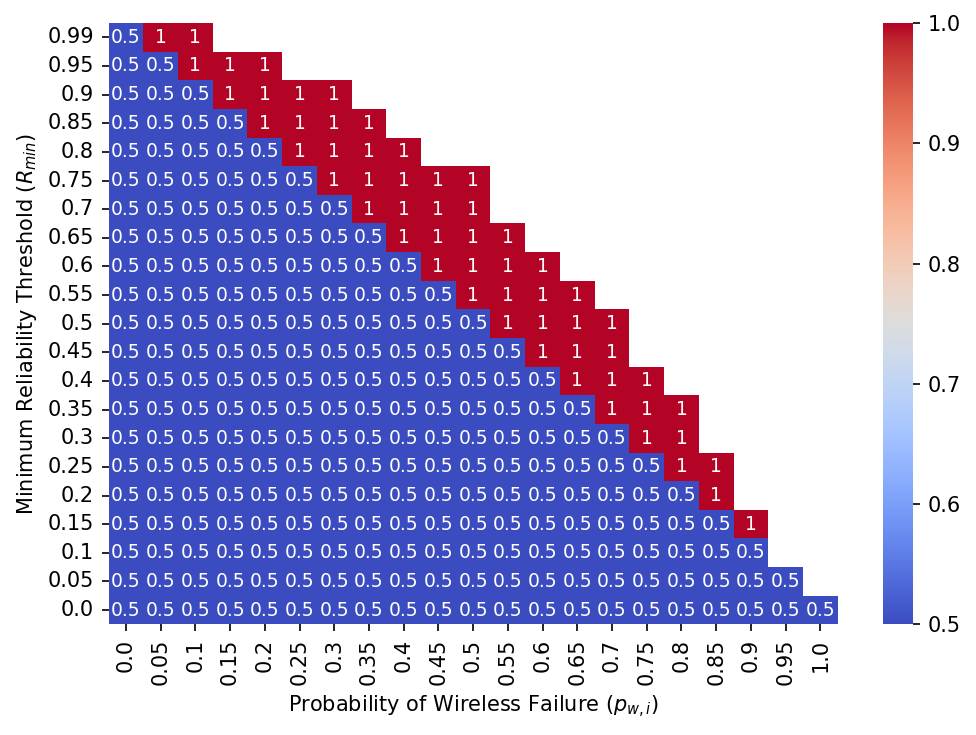

In [155]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv('res_Rmin.csv')

# Round the values of p_w_k and R_min to the nearest two decimal places
df['p_w_k'] = df['p_w_k'].round(2)
df['R_min'] = df['R_min'].round(2)

# Create a pivot table with `R_min` as rows, `p_w_k` as columns, and `l_k` as values
heatmap_data = df.pivot_table(index='R_min', columns='p_w_k', values='l_k', aggfunc='first')

# Sort the index in descending order to reverse the order on the R_min axis
heatmap_data = heatmap_data.sort_index(ascending=False)

# Plotting the heatmap
plt.figure(figsize=(7, 5), dpi=150)
sns.heatmap(heatmap_data, annot=True, cmap='coolwarm',annot_kws={"size": 9})
# plt.title('Heatmap of Bandwidth ($l_k$) Across Different $R_{min}$ and $p_w$')
plt.xlabel('Probability of Wireless Failure ($p_w$)')
plt.ylabel('Minimum Reliability Threshold ($R_{min}$)')
plt.tight_layout()
plt.savefig("./PDFs/Heatmap_Bandwidth.pdf")
plt.show()

### Obj Fun

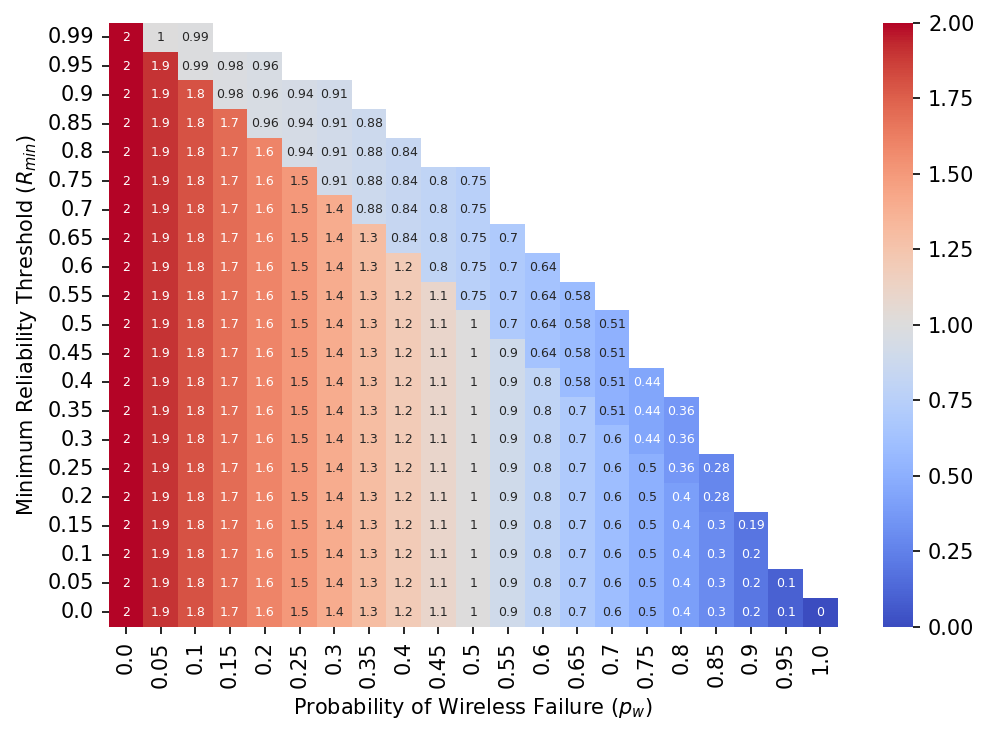

In [177]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv('res_Rmin.csv')

# Round the values of p_w_k and R_min to the nearest two decimal places
df['p_w_k'] = df['p_w_k'].round(2)
df['R_min'] = df['R_min'].round(2)
df['obj_k'] = df['obj_k'].round(2)

# Create a pivot table with `R_min` as rows, `p_w_k` as columns, and `l_k` as values
heatmap_data = df.pivot_table(index='R_min', columns='p_w_k', values='obj_k', aggfunc='first')

# Sort the index in descending order to reverse the order on the R_min axis
heatmap_data = heatmap_data.sort_index(ascending=False)

# Plotting the heatmap
plt.figure(figsize=(7, 5), dpi=150)
sns.heatmap(heatmap_data, annot=True, cmap='coolwarm',annot_kws={"size": 6})
# plt.title('Heatmap of Objective Value, $f(y^*_k)$, Across Different $R_{min}$ and $p_w$')
plt.xlabel('Probability of Wireless Failure ($p_w$)')
plt.ylabel('Minimum Reliability Threshold ($R_{min}$)')
plt.tight_layout()
plt.savefig("./PDFs/Heatmap_ObjectiveValue.pdf")
plt.show()



## Results for alpha

### Activation Binary Decision

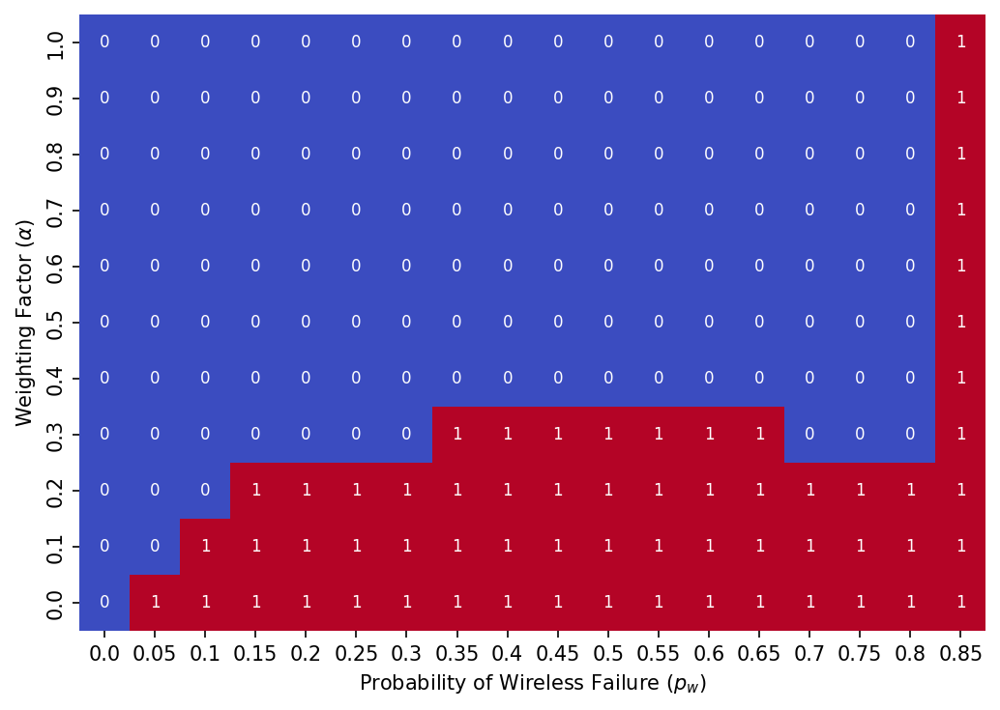

In [168]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv('res_alpha.csv')

# Round the values of p_w_k and R_min to the nearest two decimal places
df['p_w_k'] = df['p_w_k'].round(2)
df['alpha'] = df['alpha'].round(2)

# Create a pivot table with `R_min` as rows, `p_w_k` as columns, and `y_i` as values
heatmap_data = df.pivot_table(index='alpha', columns='p_w_k', values='y_k', aggfunc='first')

# Sort the index in descending order to reverse the order on the R_min axis
heatmap_data = heatmap_data.sort_index(ascending=False)

# Plotting the heatmap
plt.figure(figsize=(7, 5), dpi=150)
sns.heatmap(heatmap_data, annot=True, cmap='coolwarm', fmt=".0f", cbar=False,annot_kws={"size": 8})

# plt.title('Heatmap of Reliability Function Activation Across Different $\\alpha$ and $p_w$')
plt.xlabel('Probability of Wireless Failure ($p_w$)')
plt.ylabel('Weighting Factor ($\\alpha$)')
plt.tight_layout()
plt.savefig("./PDFs/Heatmap_RelFunctionActivation_alpha.pdf")
plt.show()



#### Case of Analaysis

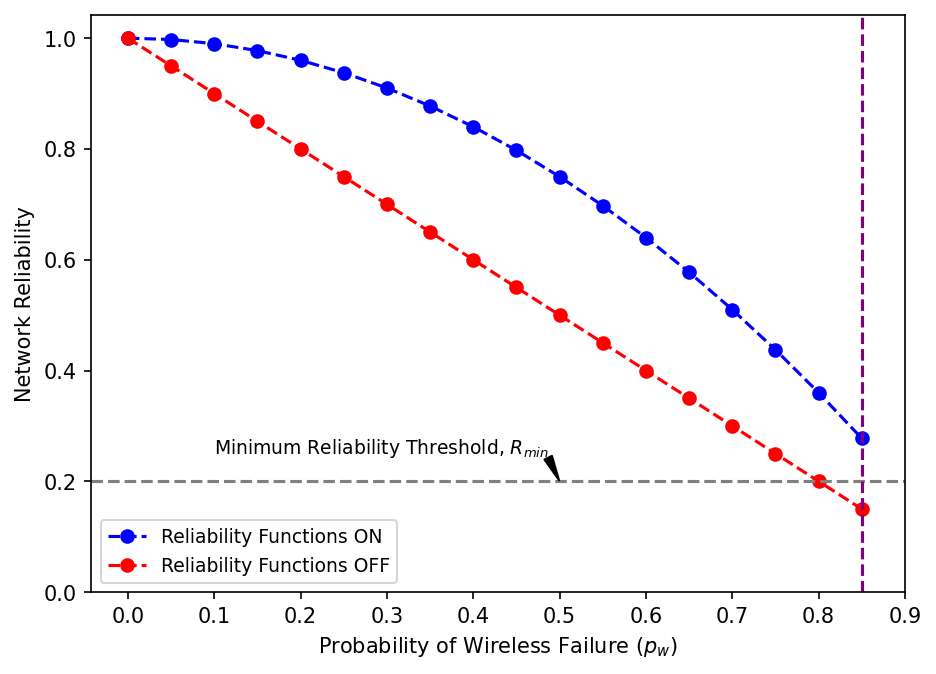

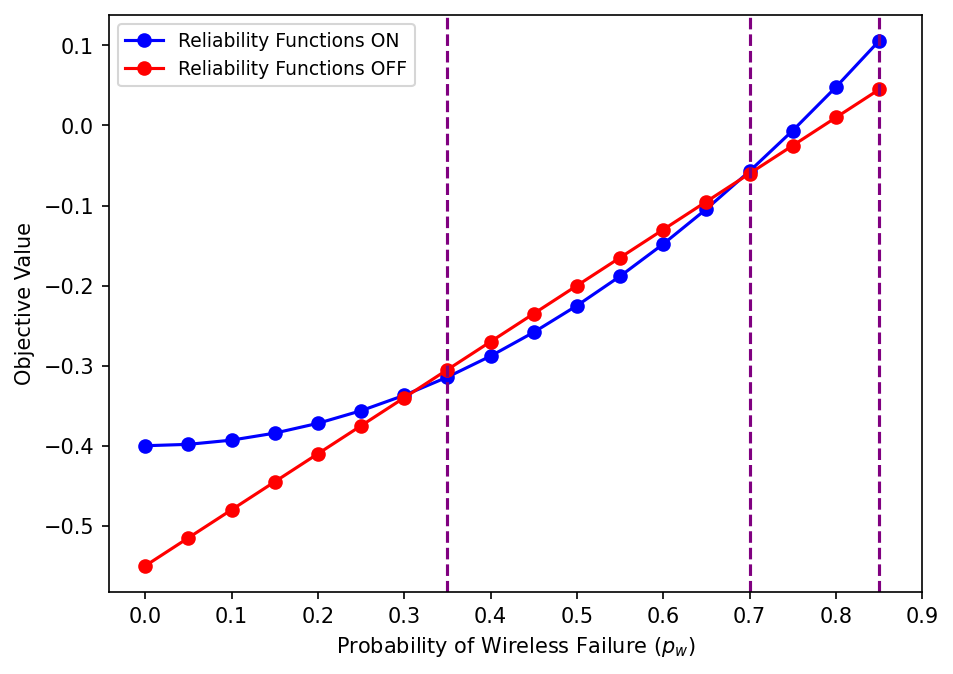

In [232]:
import pandas as pd
import matplotlib.pyplot as plt

# Data in CSV format
df = pd.read_csv('Exp2_case_analysis.csv')

# Plotting Figure 1
plt.figure(figsize=(7, 5), dpi=150)
plt.plot(df['p_w_k'], df['r_2-paths'],label='Reliability Functions ON', marker='o', linestyle='--', color='b')
plt.plot(df['p_w_k'], df['r_1-path'], label='Reliability Functions OFF', marker='o', linestyle='--', color='r')
plt.axhline(y=0.2, color='gray', linestyle='--')
plt.annotate('Minimum Reliability Threshold, $R_{min}$', xy=(0.5, 0.2), xytext=(0.1, 0.25),
             arrowprops=dict(facecolor='black', shrink=0.05, width=1, headwidth=4), fontsize=9)
plt.xlabel('Probability of Wireless Failure ($p_w$)')
plt.ylabel('Network Reliability')
plt.ylim(bottom=0)
plt.xticks(np.arange(min(df['p_w_k']), max(df['p_w_k']) + 0.1, 0.1))  # Set x-axis ticks at every 0.1 interval
plt.legend(fontsize=9)  # Sets the font size to 10 points
plt.axvline(x=0.85, color='purple', linestyle='--', label='x = 0.85')
plt.savefig("./PDFs/Exp2_Net_Rel_case_analysis.pdf")
plt.show()


# Plotting Figure 2
plt.figure(figsize=(7, 5), dpi=150)
plt.plot(df['p_w_k'], df['f_y_k_1'], label='Reliability Functions ON', marker='o', linestyle='-', color='b')
plt.plot(df['p_w_k'], df['f_y_k_0'], label='Reliability Functions OFF', marker='o', linestyle='-', color='r')
plt.xlabel('Probability of Wireless Failure ($p_w$)')
plt.ylabel('Objective Value')
plt.xticks(np.arange(min(df['p_w_k']), max(df['p_w_k']) + 0.1, 0.1))  # Set x-axis ticks at every 0.1 interval
plt.legend(fontsize=9)  # Sets the font size to 10 points
plt.axvline(x=0.35, color='purple', linestyle='--', label='x = 0.35')  
plt.axvline(x=0.7, color='purple', linestyle='--', label='x = 0.7') 
plt.axvline(x=0.85, color='purple', linestyle='--', label='x = 0.85') 
plt.savefig("./PDFs/Exp2_Obj_Fun_case_analysis.pdf")
plt.show()

### Network Reliability

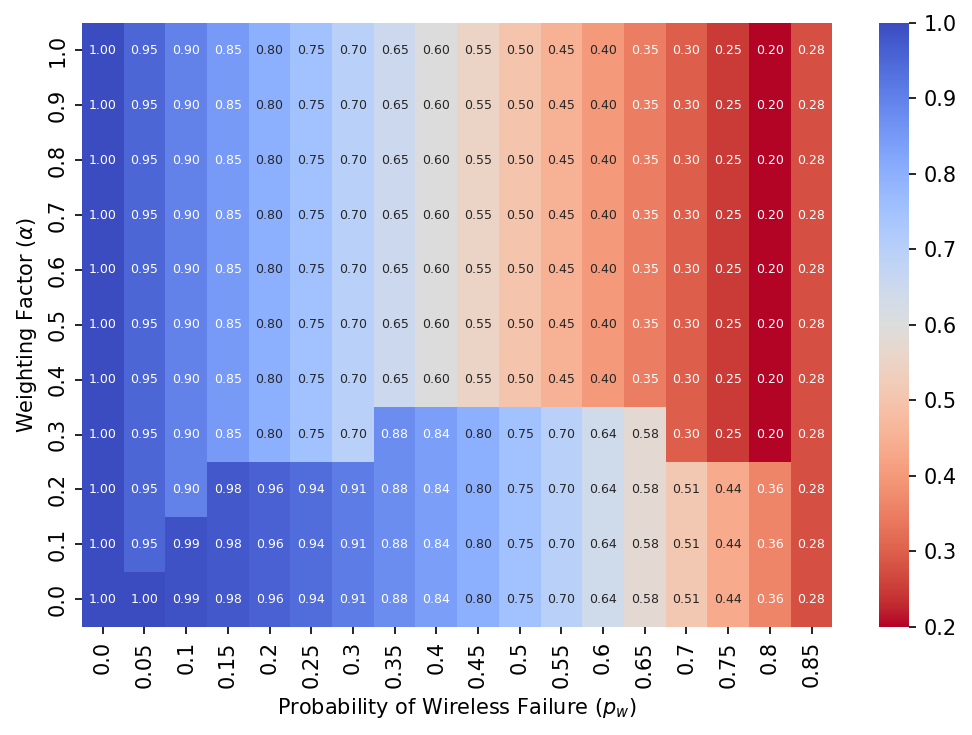

In [169]:
# Create a heatmap showing the values of r_k across Different $R_{min}$ and $p_w$.

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv('res_alpha.csv')

# Round the values of p_w_k and R_min to the nearest two decimal places
df['p_w_k'] = df['p_w_k'].round(2)
df['alpha'] = df['alpha'].round(2)

# Create a pivot table with `R_min` as rows, `p_w_k` as columns, and `r_k` as values
heatmap_data = df.pivot_table(index='alpha', columns='p_w_k', values='r_k', aggfunc='first')

# Sort the index in descending order to reverse the order on the alpha axis
heatmap_data = heatmap_data.sort_index(ascending=False)

# Plotting the heatmap
plt.figure(figsize=(7, 5), dpi=150)
sns.heatmap(heatmap_data, annot=True, cmap='coolwarm_r', fmt=".2f",annot_kws={"size": 6})
plt.xlabel('Probability of Wireless Failure ($p_w$)')
plt.ylabel('Weighting Factor ($\\alpha$)')
plt.tight_layout()
plt.savefig("./PDFs/Heatmap_NetReliability_alpha.pdf")

plt.show()



### Loading

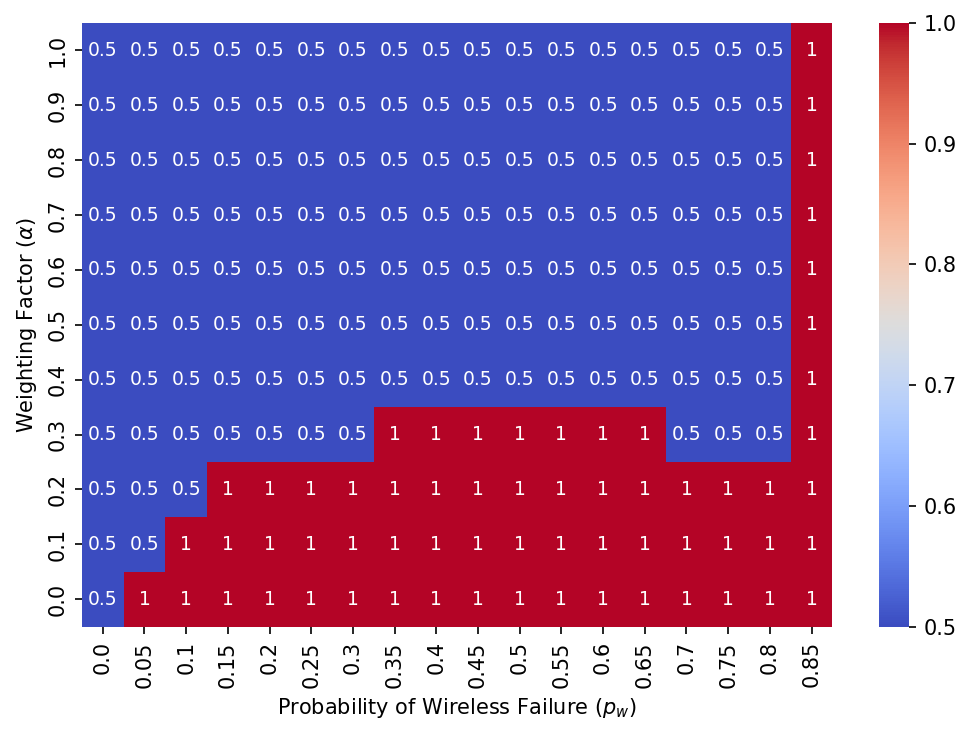

In [233]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv('res_alpha.csv')

# Round the values of p_w_k and R_min to the nearest two decimal places
df['p_w_k'] = df['p_w_k'].round(2)
df['alpha'] = df['alpha'].round(2)

# Create a pivot table with `R_min` as rows, `p_w_k` as columns, and `l_k` as values
heatmap_data = df.pivot_table(index='alpha', columns='p_w_k', values='l_k', aggfunc='first')

# Sort the index in descending order to reverse the order on the R_min axis
heatmap_data = heatmap_data.sort_index(ascending=False)

# Plotting the heatmap
plt.figure(figsize=(7, 5), dpi=150)
sns.heatmap(heatmap_data, annot=True, cmap='coolwarm',annot_kws={"size": 9})
plt.xlabel('Probability of Wireless Failure ($p_w$)')
plt.ylabel('Weighting Factor ($\\alpha$)')
plt.tight_layout()
plt.savefig("./PDFs/Heatmap_NetLoading_alpha.pdf")

plt.show()



### Obj Fun

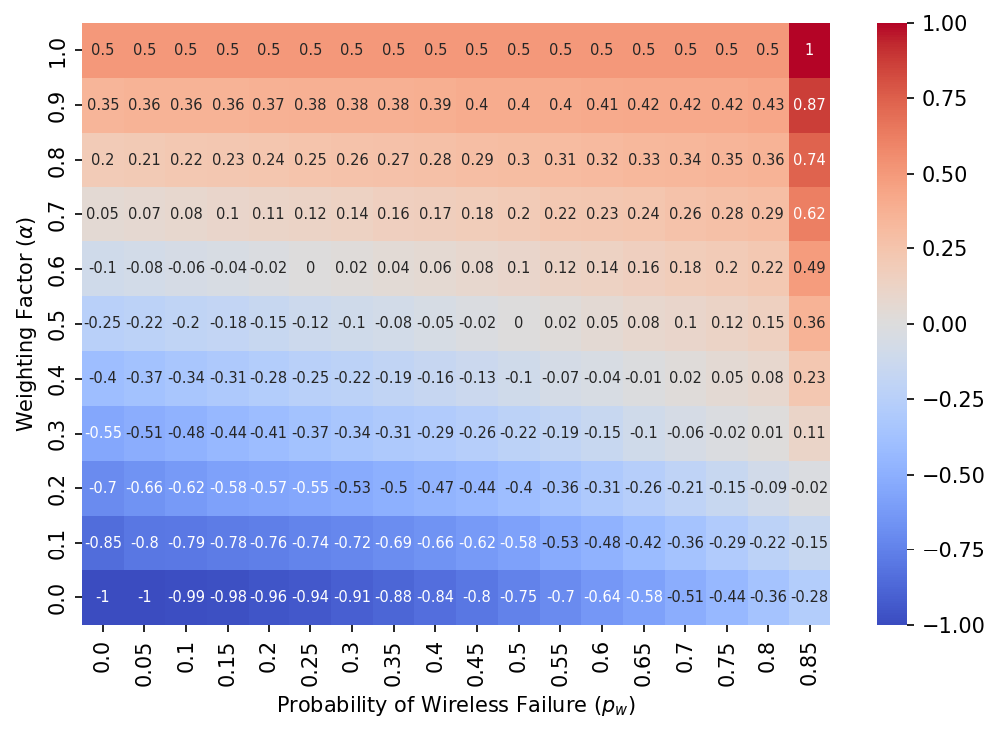

In [176]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv('res_alpha.csv')

# Round the values of p_w_k and R_min to the nearest two decimal places
df['p_w_k'] = df['p_w_k'].round(2)
df['alpha'] = df['alpha'].round(2)
df['obj_k'] = df['obj_k'].round(2)

# Create a pivot table with `R_min` as rows, `p_w_k` as columns, and `l_k` as values
heatmap_data = df.pivot_table(index='alpha', columns='p_w_k', values='obj_k', aggfunc='first')

# Sort the index in descending order to reverse the order on the R_min axis
heatmap_data = heatmap_data.sort_index(ascending=False)

# Plotting the heatmap
plt.figure(figsize=(7, 5), dpi=150)
sns.heatmap(heatmap_data, annot=True, cmap='coolwarm',annot_kws={"size": 7})
plt.xlabel('Probability of Wireless Failure ($p_w$)')
plt.ylabel('Weighting Factor ($\\alpha$)')
plt.tight_layout()
plt.savefig("./PDFs/Heatmap_ObjfFun_alpha.pdf")

plt.show()



## Night plots

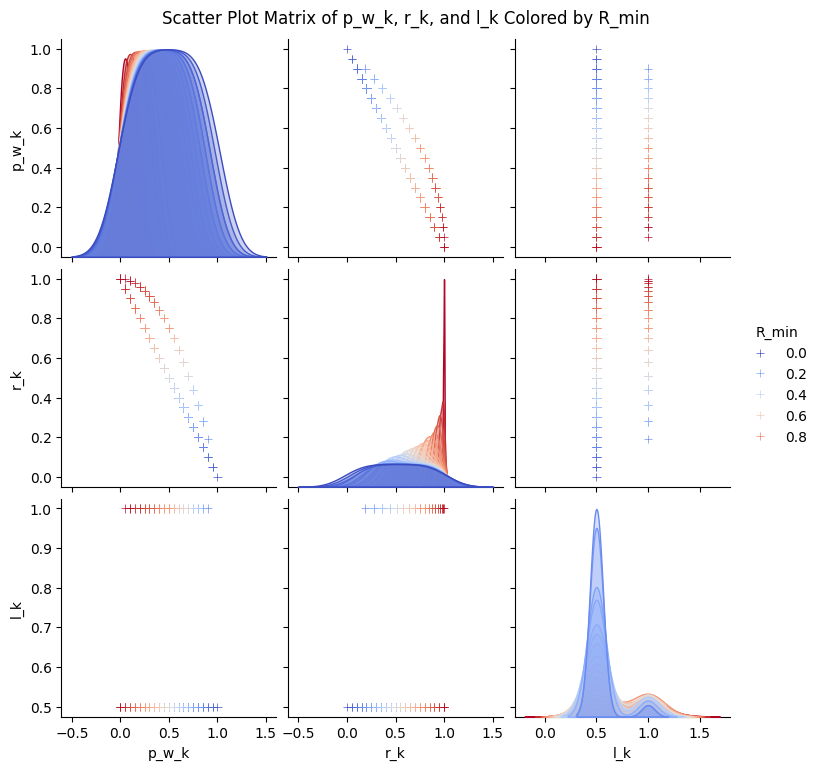

In [186]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv('res_Rmin.csv')

# Round the values of p_w_k, R_min, r_k, and l_k to the nearest two decimal places
df['p_w_k'] = df['p_w_k'].round(2)
df['R_min'] = df['R_min'].round(2)
df['r_k'] = df['r_k'].round(2)
df['l_k'] = df['l_k'].round(2)

# Use Seaborn's pairplot to create a scatter plot matrix
sns.pairplot(df, vars=['p_w_k', 'r_k', 'l_k'], hue='R_min', palette='coolwarm', markers="+")
plt.suptitle('Scatter Plot Matrix of p_w_k, r_k, and l_k Colored by R_min', y=1.02)
plt.show()


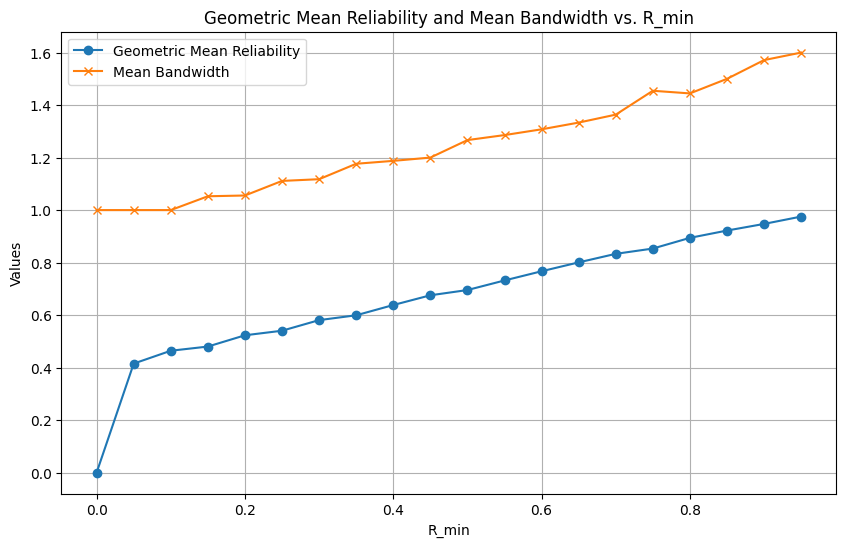

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy.stats.mstats import gmean

# Load the data
df = pd.read_csv('res_Rmin.csv')

# Group by R_min, calculate geometric mean for reliability and arithmetic mean for bandwidth
grouped = df.groupby('R_min').agg({
    'r_k': lambda x: gmean(x),  # Geometric mean of reliability
    'l_k': 'mean'               # Arithmetic mean of bandwidth
}).reset_index()

# Plotting
plt.figure(figsize=(10, 6))

# Plotting reliability
plt.plot(grouped['R_min'], grouped['r_k'], label='Geometric Mean Reliability', marker='o')

# Plotting bandwidth
plt.plot(grouped['R_min'], grouped['l_k'], label='Mean Bandwidth', marker='x')

# Adding titles and labels
plt.title('Geometric Mean Reliability and Mean Bandwidth vs. R_min')
plt.xlabel('R_min')
plt.ylabel('Values')
plt.legend()

# Show grid
plt.grid(True)

# Display the plot
plt.show()


C:\Users\emohaub\AppData\Local\Temp\ipykernel_26896\3083603508.py:35: UserWarning:

FigureCanvasAgg is non-interactive, and thus cannot be shown



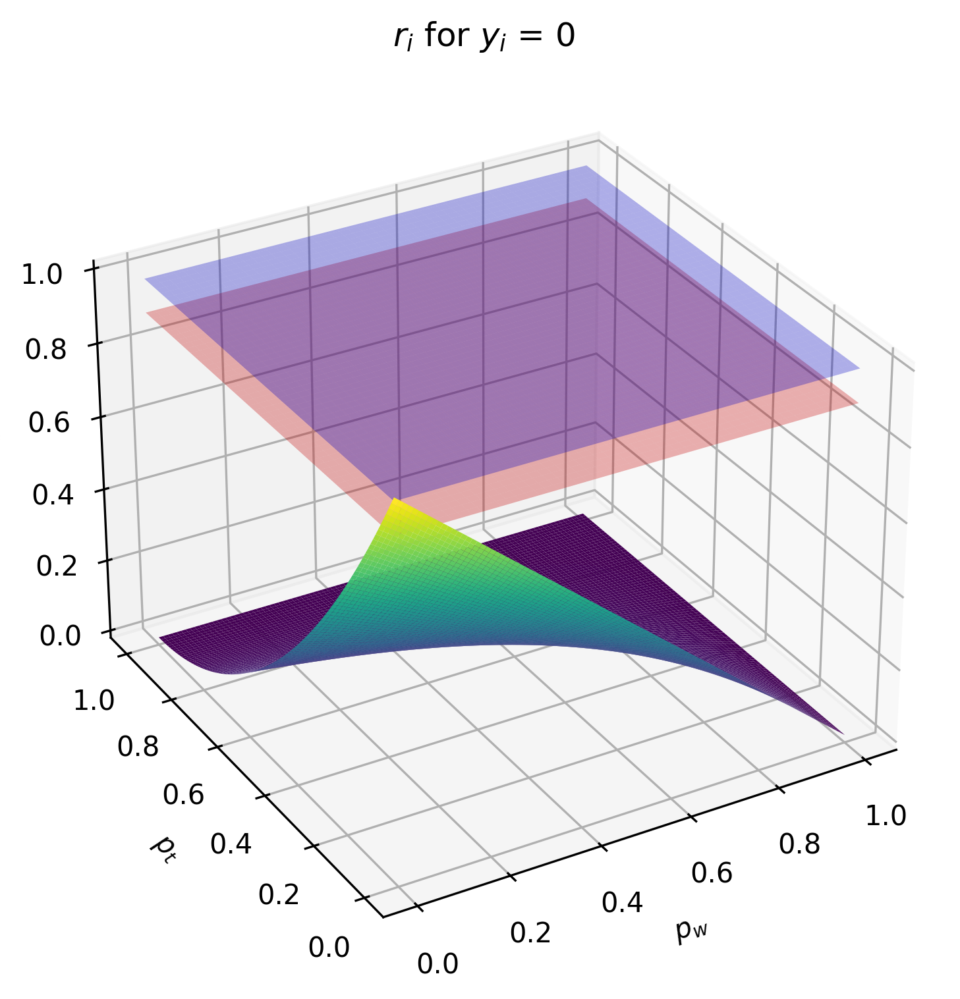

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Define parameters
p_w = np.linspace(0, 1, 100)
p_t = np.linspace(0, 1, 100)

# Create meshgrid
P_w, P_t = np.meshgrid(p_w, p_t)

# Calculate surfaces
R_i0 = (1 - P_w) * (1 - P_t)**2

# Constant z values for planes
z_plane1 = 0.90
z_plane2 = 0.99

# Arrays for Z coordinates of planes
Z_plane1 = np.full_like(P_w, z_plane1)
Z_plane2 = np.full_like(P_w, z_plane2)

# Plot for y_i = 0
fig0 = plt.figure(figsize=(8, 6), dpi=300)
ax0 = fig0.add_subplot(111, projection='3d')
surface = ax0.plot_surface(P_w, P_t, R_i0, cmap='viridis', linewidth=5, rstride=1, cstride=1)
ax0.plot_surface(P_w, P_t, Z_plane1, color='red', alpha=0.3)
ax0.plot_surface(P_w, P_t, Z_plane2, color='blue', alpha=0.3)

ax0.set_title('$r_k$ for $y_i$ = 0')
ax0.set_xlabel('$p_w$')
ax0.set_ylabel('$p_t$')
ax0.set_zlabel('$r_k$')
ax0.view_init(elev=30, azim=240)  # Change viewing angle
fig0.show()


C:\Users\emohaub\AppData\Local\Temp\ipykernel_26896\2411272462.py:40: UserWarning:

FigureCanvasAgg is non-interactive, and thus cannot be shown



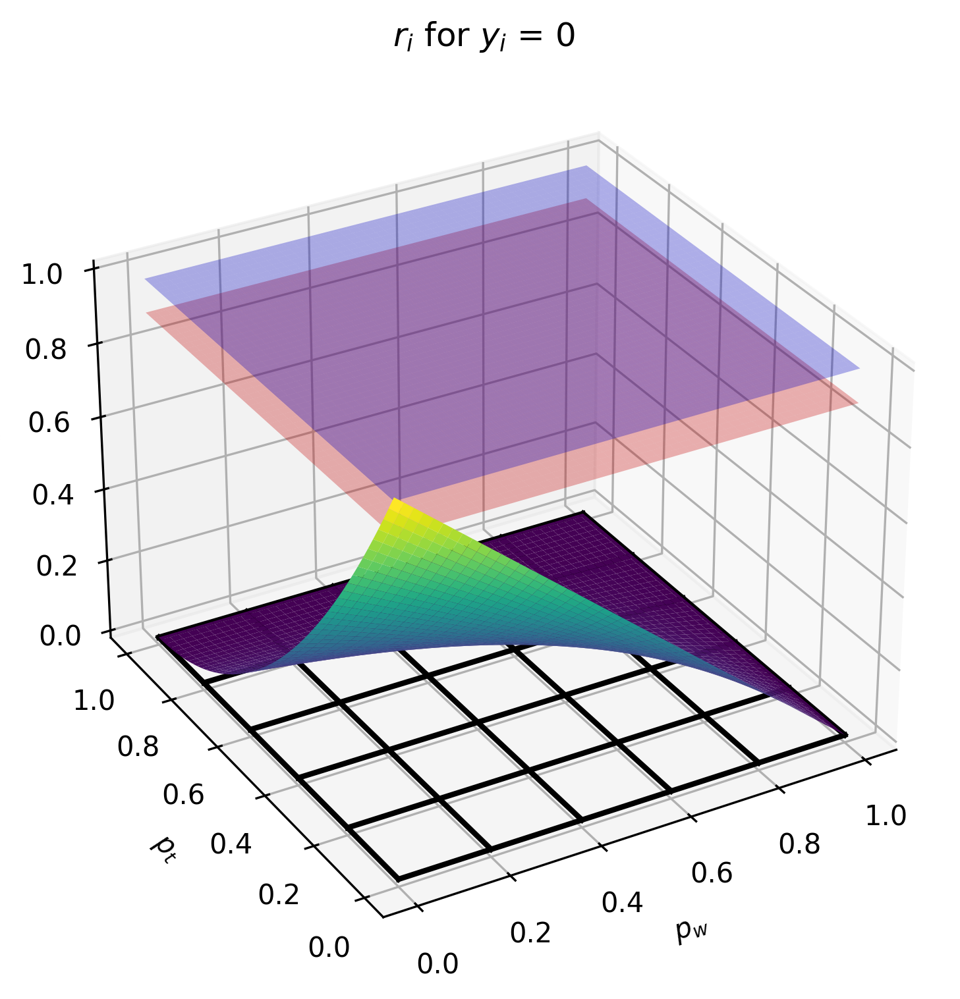

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Define parameters
p_w = np.linspace(0, 1, 100)
p_t = np.linspace(0, 1, 100)

# Create meshgrid
P_w, P_t = np.meshgrid(p_w, p_t)

# Calculate surfaces
R_i0 = (1 - P_w) * (1 - P_t)**2

# Constant z values for planes
z_plane1 = 0.90
z_plane2 = 0.99

# Arrays for Z coordinates of planes
Z_plane1 = np.full_like(P_w, z_plane1)
Z_plane2 = np.full_like(P_w, z_plane2)

# Plot for y_i = 0
fig0 = plt.figure(figsize=(8, 6), dpi=300)
ax0 = fig0.add_subplot(111, projection='3d')
ax0.plot_surface(P_w, P_t, R_i0, cmap='viridis', edgecolor='none')
ax0.plot_surface(P_w, P_t, Z_plane1, color='red', alpha=0.3)
ax0.plot_surface(P_w, P_t, Z_plane2, color='blue', alpha=0.3)

# Drawing thicker grid lines by overlaying 3D lines
for val in np.arange(0, 1.1, 0.2):
    ax0.plot([val, val], [0, 1], [0, 0], color='k', linewidth=2)  # x grid lines
    ax0.plot([0, 1], [val, val], [0, 0], color='k', linewidth=2)  # y grid lines

ax0.set_title('$r_k$ for $y_i$ = 0')
ax0.set_xlabel('$p_w$')
ax0.set_ylabel('$p_t$')
ax0.set_zlabel('$r_k$')
ax0.view_init(elev=30, azim=240)  # Change viewing angle
fig0.show()


C:\Users\emohaub\AppData\Local\Temp\ipykernel_26896\3272325649.py:37: UserWarning:

FigureCanvasAgg is non-interactive, and thus cannot be shown



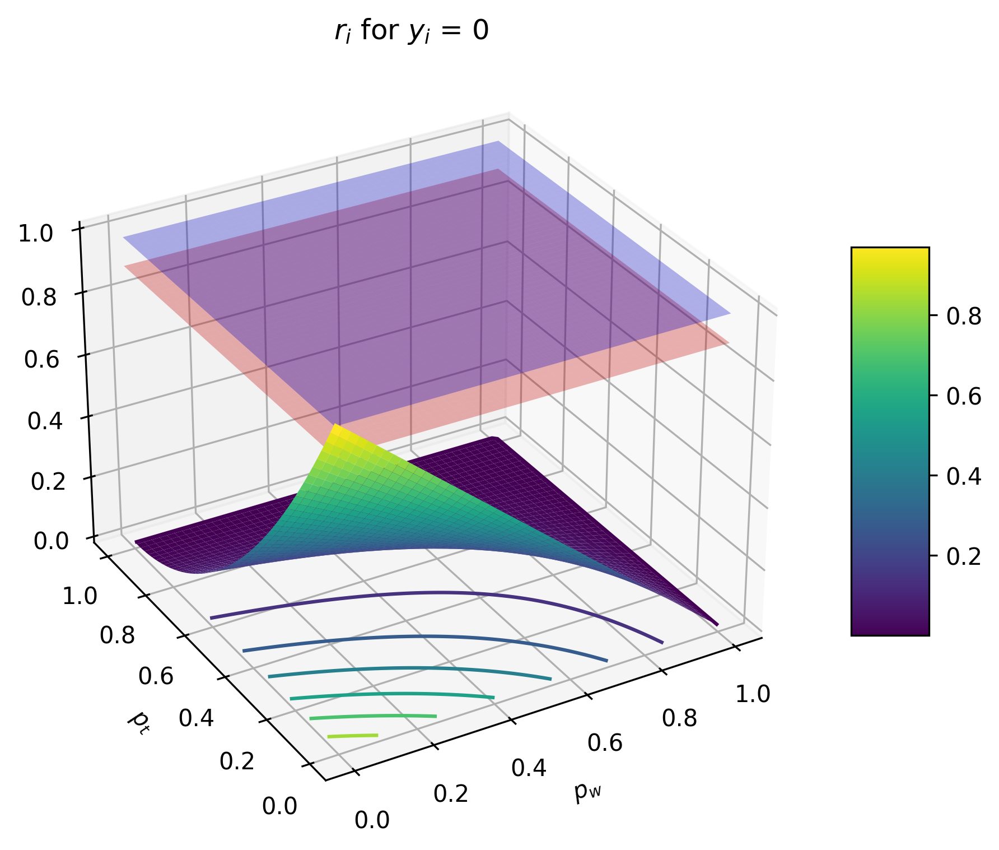

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Define parameters
p_w = np.linspace(0, 1, 100)
p_t = np.linspace(0, 1, 100)

# Create meshgrid
P_w, P_t = np.meshgrid(p_w, p_t)

# Calculate surfaces
R_i0 = (1 - P_w) * (1 - P_t)**2
R_i1 = 1 - (1 - (1 - P_w) * (1 - P_t)**2)**2

# Constant z values for planes
z_plane1 = 0.90
z_plane2 = 0.99

# Arrays for Z coordinates of planes
Z_plane1 = np.full_like(P_w, z_plane1)
Z_plane2 = np.full_like(P_w, z_plane2)

# Plot for y_i = 0
fig0 = plt.figure(figsize=(8, 6), dpi=300)
ax0 = fig0.add_subplot(111, projection='3d')
surface = ax0.plot_surface(P_w, P_t, R_i0, cmap='viridis', edgecolor='none')
contours = ax0.contour(P_w, P_t, R_i0, zdir='z', offset=0, cmap='viridis')
fig0.colorbar(surface, ax=ax0, shrink=0.5, aspect=5)
ax0.plot_surface(P_w, P_t, Z_plane1, color='red', alpha=0.3)
ax0.plot_surface(P_w, P_t, Z_plane2, color='blue', alpha=0.3)
ax0.set_title('$r_k$ for $y_i$ = 0')
ax0.set_xlabel('$p_w$')
ax0.set_ylabel('$p_t$')
ax0.set_zlabel('$r_k$')
ax0.view_init(elev=30, azim=240)  # Change viewing angle
fig0.show()


C:\Users\emohaub\AppData\Local\Temp\ipykernel_1220\3230125316.py:42: UserWarning:

FigureCanvasAgg is non-interactive, and thus cannot be shown

C:\Users\emohaub\AppData\Local\Temp\ipykernel_1220\3230125316.py:59: UserWarning:

FigureCanvasAgg is non-interactive, and thus cannot be shown



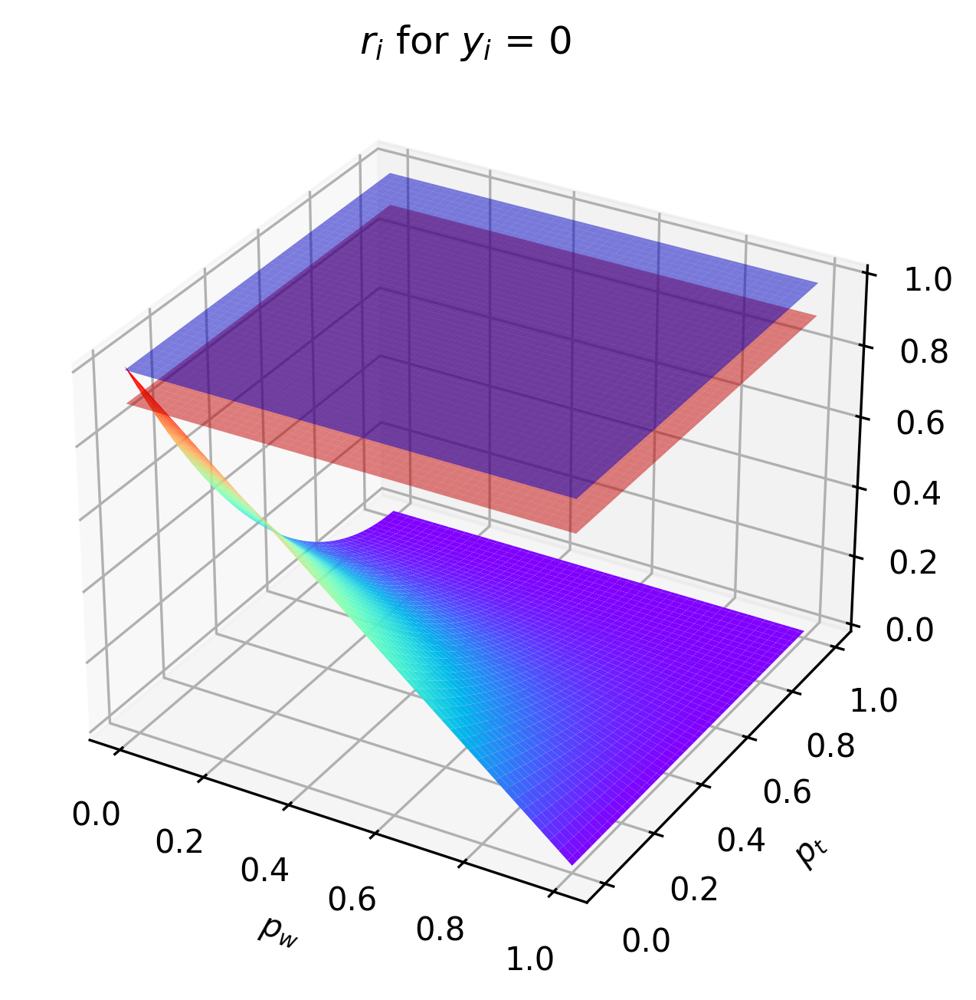

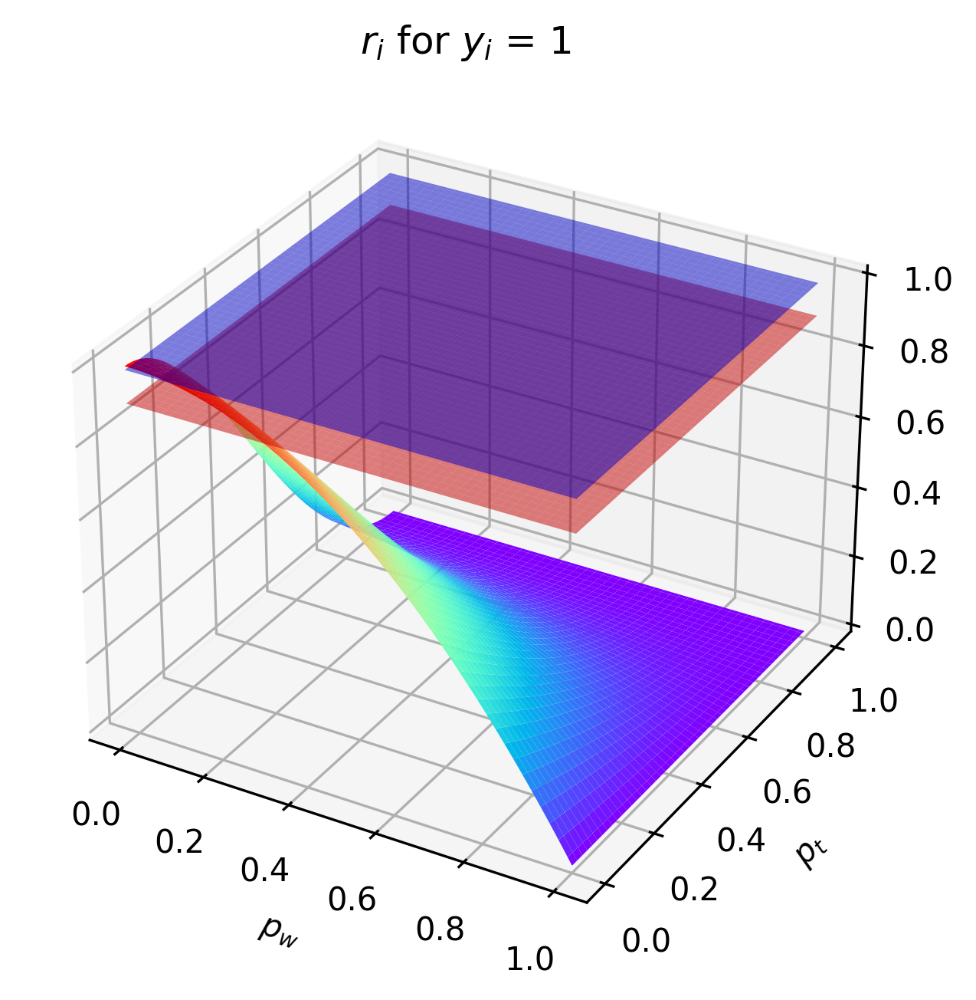

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Define the parameters
p_w = np.linspace(0, 1, 100)
p_t = np.linspace(0, 1, 100)

# Create a meshgrid for 3D plotting
P_w, P_t = np.meshgrid(p_w, p_t)

# Calculate r_k for y_i = 0
R_i0 = (1 - P_w) * (1 - P_t)**2

# Calculate r_k for y_i = 1
R_i1 = 1 - (1 - (1 - P_w) * (1 - P_t)**2)**2

# Define the constant z values for the planes
z_plane1 = 0.90
z_plane2 = 0.99

# Create a constant array to use for the Z coordinate of the planes
Z_plane1 = np.full_like(P_w, z_plane1)
Z_plane2 = np.full_like(P_w, z_plane2)

colormap = 'rainbow'

# Plot for y_i = 0
fig0 = plt.figure(figsize=(7, 5), dpi=300)
ax0 = fig0.add_subplot(111, projection='3d')
ax0.plot_surface(P_w, P_t, R_i0, cmap=colormap)
ax0.plot_surface(P_w, P_t, Z_plane1, color='red', alpha=0.5)  # 50% transparent red plane at Z=0.90
ax0.plot_surface(P_w, P_t, Z_plane2, color='blue', alpha=0.5)  # 50% transparent blue plane at Z=0.99
ax0.set_title('$r_k$ for $y_i$ = 0')
ax0.set_xlabel('$p_w$')
ax0.set_ylabel('$p_t$')
ax0.set_zlabel('$r_k$')
ax0.set_xticks(np.arange(0, 1.1, 0.2))
ax0.set_yticks(np.arange(0, 1.1, 0.2))
ax0.set_zticks(np.arange(0, 1.1, 0.2))
ax0.grid(True)
fig0.show()
fig0.savefig("./PDFs/3DPlot_Ri_vs_loss_TSN_OFF.pdf")

# Plot for y_i = 1
fig1 = plt.figure(figsize=(7, 5), dpi=300)
ax1 = fig1.add_subplot(111, projection='3d')
ax1.plot_surface(P_w, P_t, R_i1, cmap=colormap)
ax1.plot_surface(P_w, P_t, Z_plane1, color='red', alpha=0.5)
ax1.plot_surface(P_w, P_t, Z_plane2, color='blue', alpha=0.5)
ax1.set_title('$r_k$ for $y_i$ = 1')
ax1.set_xlabel('$p_w$')
ax1.set_ylabel('$p_t$')
ax1.set_zlabel('$r_k$')
ax1.set_xticks(np.arange(0, 1.1, 0.2))
ax1.set_yticks(np.arange(0, 1.1, 0.2))
ax1.set_zticks(np.arange(0, 1.1, 0.2))
ax1.grid(True)
fig1.show()
fig1.savefig("./PDFs/3DPlot_Ri_vs_loss_TSN_ON.pdf")


C:\Users\emohaub\AppData\Local\Temp\ipykernel_26896\1702005049.py:36: UserWarning:

FigureCanvasAgg is non-interactive, and thus cannot be shown



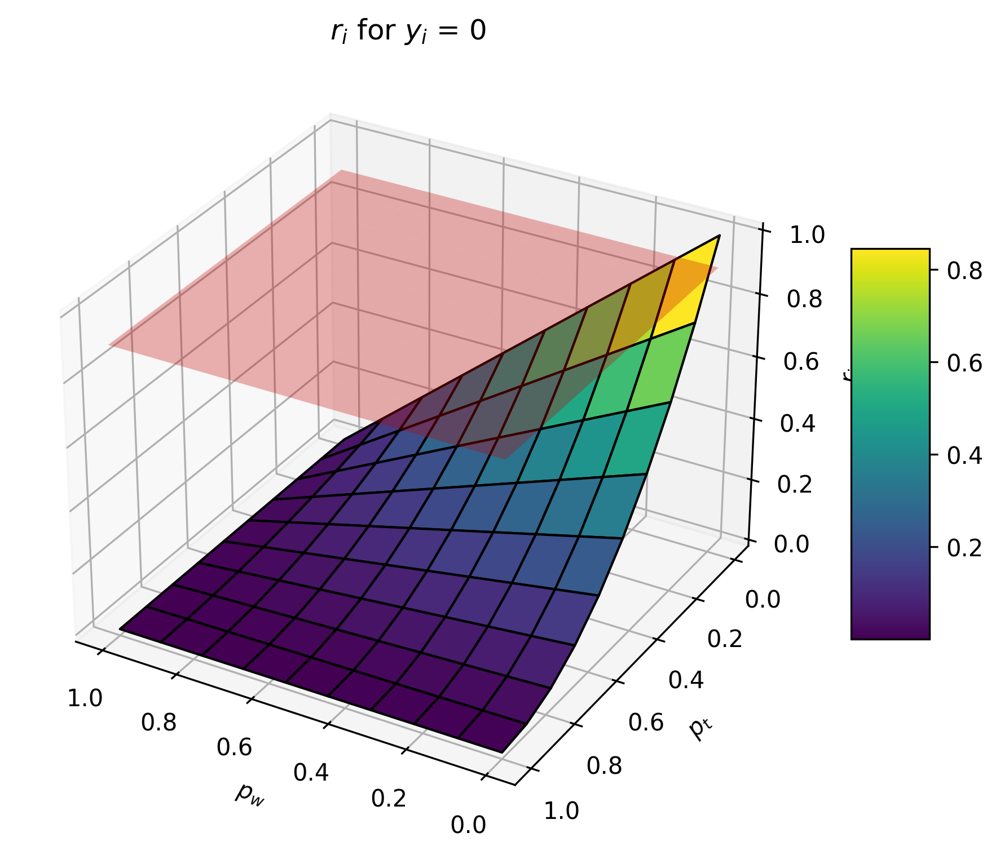

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Define parameters
p_w = np.linspace(0, 1, 10)
p_t = np.linspace(0, 1, 10)

# Create meshgrid
P_w, P_t = np.meshgrid(p_w, p_t)

# Calculate surfaces
R_i0 = (1 - P_w) * (1 - P_t)**2

# Constant z values for planes
z_plane1 = 0.90

# Arrays for Z coordinates of planes
Z_plane1 = np.full_like(P_w, z_plane1)

# Plot for y_i = 0
fig0 = plt.figure(figsize=(8, 6), dpi=300)
ax0 = fig0.add_subplot(111, projection='3d')
surface = ax0.plot_surface(P_w, P_t, R_i0, cmap='viridis', edgecolor='k', linewidth=1,shade=True)
ax0.plot_surface(P_w, P_t, Z_plane1, color='red', alpha=0.3)
ax0.set_title('$r_k$ for $y_i$ = 0')
ax0.set_xlabel('$p_w$')
ax0.set_ylabel('$p_t$')
ax0.set_zlabel('$r_k$')

# Adjust viewing angle
ax0.view_init(elev=30, azim=120)  # Experiment with different angles

fig0.colorbar(surface, ax=ax0, shrink=0.5, aspect=5)  # Add a color bar to understand the color mapping

fig0.show()


C:\Users\emohaub\AppData\Local\Temp\ipykernel_26896\2333612253.py:37: UserWarning:

FigureCanvasAgg is non-interactive, and thus cannot be shown



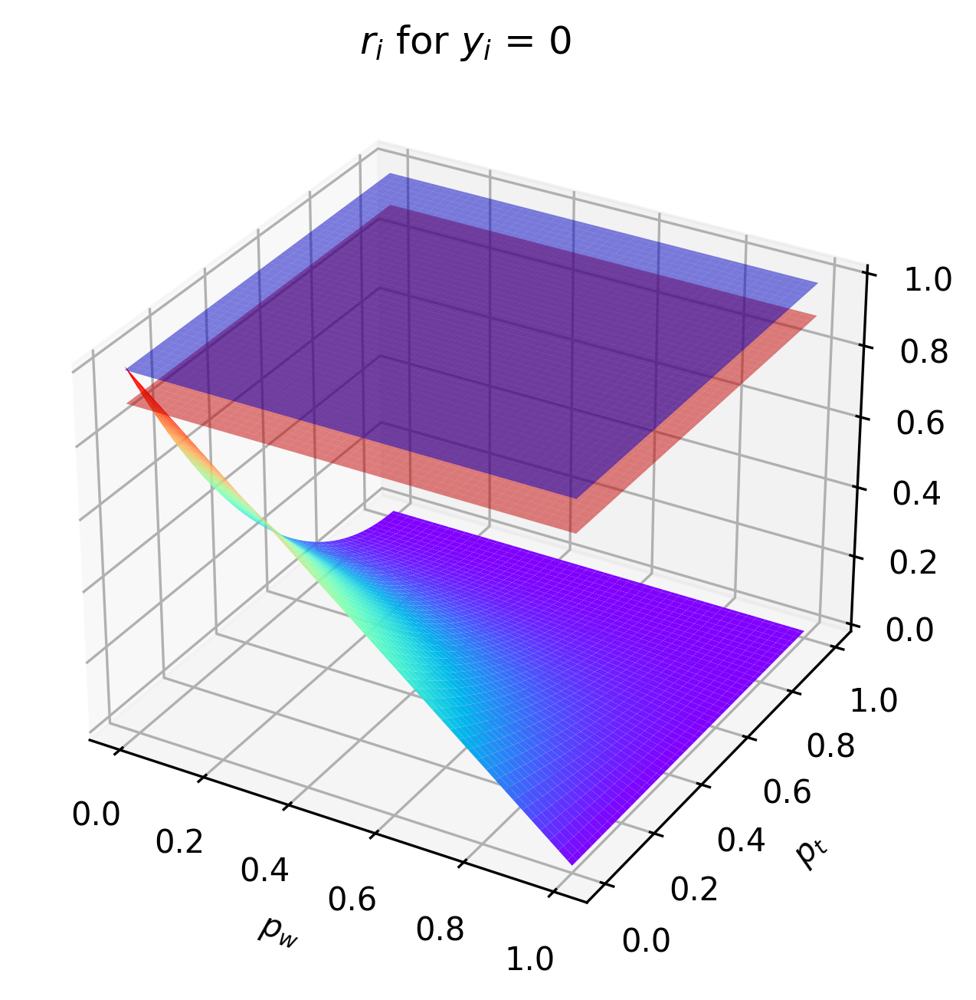

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Define the parameters
p_w = np.linspace(0, 1, 100)
p_t = np.linspace(0, 1, 100)

# Create a meshgrid for 3D plotting
P_w, P_t = np.meshgrid(p_w, p_t)

# Calculate r_k for y_i = 0
R_i0 = (1 - P_w) * (1 - P_t)**2

# Define the constant z values for the planes
z_plane1 = 0.90

# Create a constant array to use for the Z coordinate of the planes
Z_plane1 = np.full_like(P_w, z_plane1)

colormap = 'rainbow'

# Plot for y_i = 0
fig0 = plt.figure(figsize=(7, 5), dpi=300)
ax0 = fig0.add_subplot(111, projection='3d')
ax0.plot_surface(P_w, P_t, R_i0, cmap=colormap)
ax0.plot_surface(P_w, P_t, Z_plane1, color='red', alpha=0.5)  # 50% transparent red plane at Z=0.90
ax0.plot_surface(P_w, P_t, Z_plane2, color='blue', alpha=0.5)  # 50% transparent blue plane at Z=0.99
ax0.set_title('$r_k$ for $y_i$ = 0')
ax0.set_xlabel('$p_w$')
ax0.set_ylabel('$p_t$')
ax0.set_zlabel('$r_k$')
ax0.set_xticks(np.arange(0, 1.1, 0.2))
ax0.set_yticks(np.arange(0, 1.1, 0.2))
ax0.set_zticks(np.arange(0, 1.1, 0.2))
ax0.grid(True)
fig0.show()



In [ ]:
import plotly.graph_objects as go
import numpy as np

# Define the parameters
p_w = np.linspace(0, 1, 100)
p_t = np.linspace(0, 1, 100)
P_w, P_t = np.meshgrid(p_w, p_t)

# Calculate r_k for y_i = 0
R_i0 = (1 - P_w) * (1 - P_t)**2

# Calculate r_k for y_i = 1
R_i1 = 1 - (1 - (1 - P_w) * (1 - P_t)**2)**2

# Define the constant z values for the planes
z_plane1 = 0.90
z_plane2 = 0.99

# Create a constant array to use for the Z coordinate of the planes
Z_plane1 = np.full_like(P_w, z_plane1)
Z_plane2 = np.full_like(P_w, z_plane2)

# Prepare colors for the planes
color_plane1 = np.full(P_w.shape, 'red')
color_plane2 = np.full(P_w.shape, 'blue')

# Plot for y_i = 0
fig = go.Figure()

# Adding the surface for r_k when y_i = 0
fig.add_trace(go.Surface(x=P_w, y=P_t, z=R_i0, colorscale='Viridis', name='r_k for y_i = 0'))

# Adding transparent planes
fig.add_trace(go.Surface(x=P_w, y=P_t, z=Z_plane1, opacity=0.5, showscale=False, surfacecolor=color_plane1, name='Plane at Z=0.90'))
fig.add_trace(go.Surface(x=P_w, y=P_t, z=Z_plane2, opacity=0.5, showscale=False, surfacecolor=color_plane2, name='Plane at Z=0.99'))

fig.update_layout(title='Plot for y_i = 0', autosize=True, scene=dict(
                    xaxis_title='p_w',
                    yaxis_title='p_t',
                    zaxis_title='r_k'))

# Plot for y_i = 1
fig1 = go.Figure()

# Adding the surface for r_k when y_i = 1
fig1.add_trace(go.Surface(x=P_w, y=P_t, z=R_i1, colorscale='Viridis', name='r_k for y_i = 1'))

# Adding transparent planes
fig1.add_trace(go.Surface(x=P_w, y=P_t, z=Z_plane1, opacity=0.5, showscale=False, surfacecolor=color_plane1, name='Plane at Z=0.90'))
fig1.add_trace(go.Surface(x=P_w, y=P_t, z=Z_plane2, opacity=0.5, showscale=False, surfacecolor=color_plane2, name='Plane at Z=0.99'))

fig1.update_layout(title='Plot for y_i = 1', autosize=True, scene=dict(
                    xaxis_title='p_w',
                    yaxis_title='p_t',
                    zaxis_title='r_k'))

fig.show()
fig1.show()


In [ ]:
import plotly.graph_objects as go
import numpy as np

# Define the parameters
p_w = np.linspace(0, 1, 100)
p_t = np.linspace(0, 1, 100)
P_w, P_t = np.meshgrid(p_w, p_t)
R_i0 = (1 - P_w) * (1 - P_t)**2

fig = go.Figure(data=[go.Surface(z=R_i0, x=P_w, y=P_t)])
fig.update_layout(title='3D Plot', autosize=False,
                  width=500, height=500,
                  margin=dict(l=65, r=50, b=65, t=90))
fig.show()


In [ ]:
import pandas as pd
from gurobipy import Model, GRB

def optimize_network(params):
    # Unpack parameters
    p_w, p_t1, R_min, B_max = params

    # Initialize the model
    m = Model("5G_Network_Optimization")
    m.setParam('OutputFlag', 0)  # Turn off Gurobi output

    # Network conditions: Green, Orange, Red
    conditions = ['Green', 'Orange', 'Red']
    d = 1     # Data size per packet
    K = 0     # Fixed overhead
    alpha = 1 # Weight for bandwidth
    beta = 1  # Weight for reliability

    # Decision variables
    y = m.addVars(conditions, vtype=GRB.BINARY, name="y")
    b = m.addVars(conditions, name="b")
    r = m.addVars(conditions, name="r")

    # Bandwidth and reliability calculations for each condition
    for i in conditions:
        m.addConstr(b[i] == K + (1 + y[i]) * d, name=f"bandwidth_{i}")
        base_reliability = (1 - p_w[i]) * (1 - p_t1)
        m.addConstr(r[i] == (1 - y[i]) * base_reliability + y[i] * (1 - (1 - base_reliability)**2), name=f"reliability_{i}")

    # Objective function
    m.setObjective(alpha * sum(b[i] * y[i] for i in conditions) - (beta) * sum(r[i] * y[i] for i in conditions), GRB.MINIMIZE)

    # Constraints
    m.addConstr(sum(b[i] for i in conditions) <= B_max, name="Bandwidth_Constraint")
    m.addConstrs((r[i] >= R_min for i in conditions), name="Reliability_Constraint")

    # Optimize the model
    m.optimize()

    # Extract results
    if m.status == GRB.OPTIMAL:
        return {i: (y[i].X, b[i].X, r[i].X) for i in conditions}
    else:
        return None

# Parameter ranges
p_w_values = [(0, 0.005 + 0.005 * i, 0.01 + 0.01 * i) for i in range(5)]
p_t1_values = [0.0001 * (10 ** i) for i in range(-3, 2)]
R_min_values = [0.99, 0.995, 0.999]
B_max_values = [5, 6, 7]

results = []

# Test all combinations of parameters
for p_w_green, p_w_orange, p_w_red in p_w_values:
    for p_t1 in p_t1_values:
        for R_min in R_min_values:
            for B_max in B_max_values:
                p_w = {'Green': p_w_green, 'Orange': p_w_orange, 'Red': p_w_red}
                params = (p_w, p_t1, R_min, B_max)
                result = optimize_network(params)
                if result:
                    results.append({
                        'p_w_Orange': p_w_orange,
                        'p_w_Red': p_w_red,
                        'p_t1': p_t1,
                        'R_min': R_min,
                        'B_max': B_max,
                        'Green_y': result['Green'][0],
                        'Green_b': result['Green'][1],
                        'Green_r': result['Green'][2],
                        'Orange_y': result['Orange'][0],
                        'Orange_b': result['Orange'][1],
                        'Orange_r': result['Orange'][2],
                        'Red_y': result['Red'][0],
                        'Red_b': result['Red'][1],
                        'Red_r': result['Red'][2]
                    })

# Convert results to DataFrame and save to CSV
df = pd.DataFrame(results)
df.to_csv('sensitivity_analysis_results.csv', index=False)
print("Results saved to 'sensitivity_analysis_results.csv'.")


Results saved to 'sensitivity_analysis_results.csv'.


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load results
df = pd.read_csv('sensitivity_analysis_results.csv')

# Heatmap of reliability in Orange condition as a function of p_w_Orange and p_t1
pivot_table = df.pivot("p_w_Orange", "p_t1", "Orange_r")
plt.figure(figsize=(10, 8))
sns.heatmap(pivot_table, annot=True, fmt=".2f", cmap="coolwarm")
plt.title('Reliability in Orange Condition')
plt.xlabel('p_t1')
plt.ylabel('p_w_Orange')
plt.show()


TypeError: DataFrame.pivot() takes 1 positional argument but 4 were given

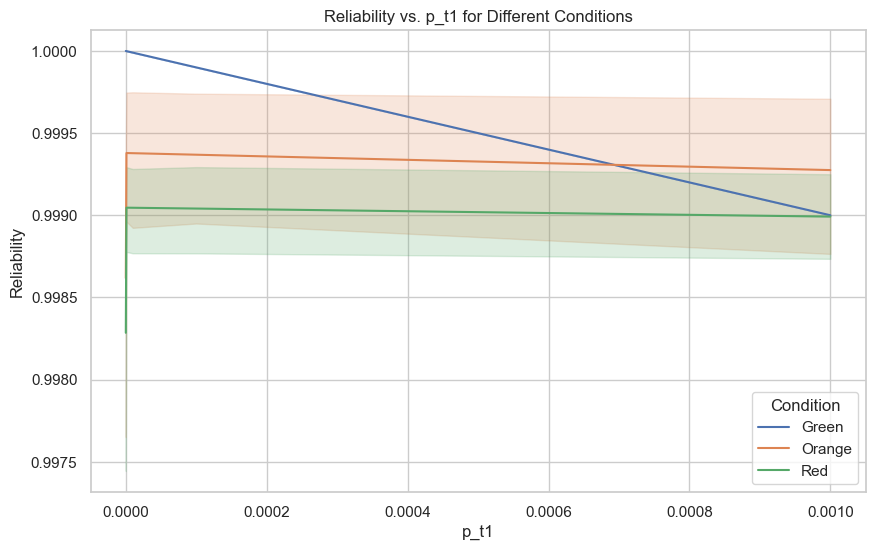

In [ ]:
plt.figure(figsize=(10, 6))
for condition in ['Green_r', 'Orange_r', 'Red_r']:
    sns.lineplot(data=df, x='p_t1', y=condition, label=condition.split('_')[0])
plt.title('Reliability vs. p_t1 for Different Conditions')
plt.xlabel('p_t1')
plt.ylabel('Reliability')
plt.legend(title='Condition')
plt.grid(True)
plt.show()


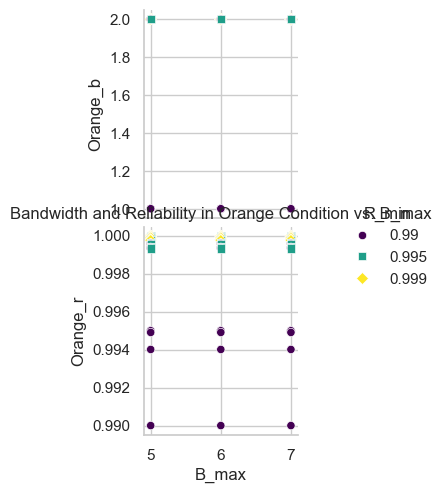

In [ ]:
sns.pairplot(df, x_vars=["B_max"], y_vars=["Orange_b", "Orange_r"], hue="R_min", kind="scatter", palette="viridis", markers=["o", "s", "d"])
plt.title('Bandwidth and Reliability in Orange Condition vs. B_max')
plt.show()


C:\Users\emohaub\AppData\Local\Temp\ipykernel_8520\2440483317.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\emohaub\AppData\Local\Temp\ipykernel_8520\2440483317.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\emohaub\AppData\Local\Temp\ipykernel_8520\2440483317.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




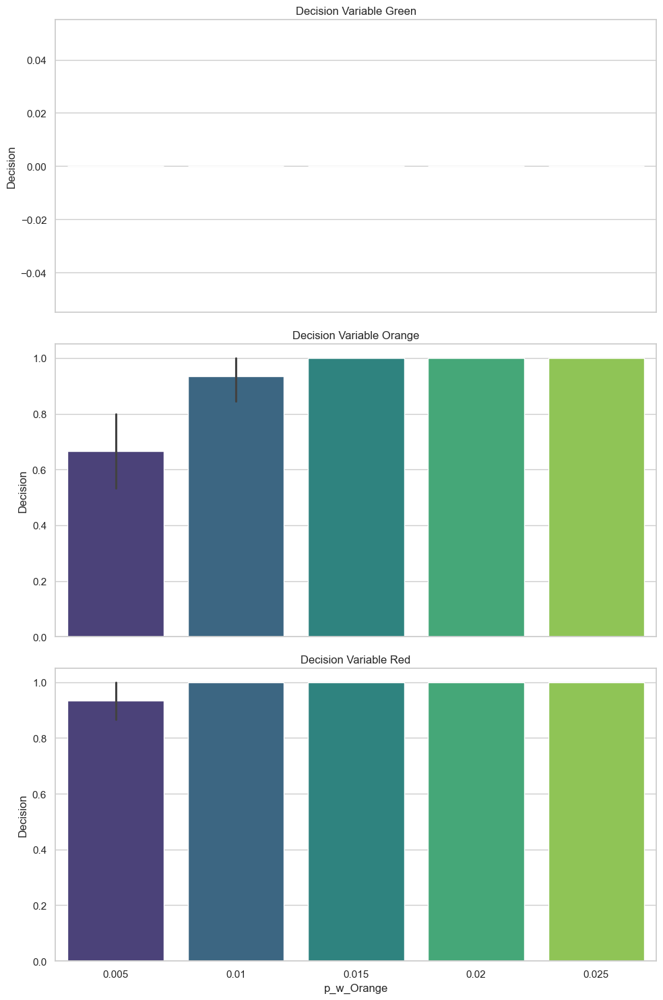

In [ ]:
fig, ax = plt.subplots(3, 1, figsize=(10, 15), sharex=True)
conditions = ['Green_y', 'Orange_y', 'Red_y']
for i, condition in enumerate(conditions):
    sns.barplot(data=df, x='p_w_Orange', y=condition, ax=ax[i], palette='viridis')
    ax[i].set_title(f'Decision Variable {condition.split("_")[0]}')
    ax[i].set_ylabel('Decision')
ax[2].set_xlabel('p_w_Orange')
plt.tight_layout()
plt.show()


In [ ]:
import csv
from gurobipy import Model, GRB

# Initialize variables for storing results
results = []

# Parameters to test
alpha_values = [0.5, 1, 2]  # Example values for alpha
beta_values = [0.5, 1, 2]   # Example values for beta
R_min_values = [0.990, 0.995, 0.999]
B_max_values = [5, 6, 7]

# Loop over parameter values
for alpha in alpha_values:
    for beta in beta_values:
        for R_min in R_min_values:
            for B_max in B_max_values:
                # Initialize the model in each iteration
                m = Model("5G_Network_Optimization")

                # Network conditions: Green, Orange, Red
                conditions = ['Green', 'Orange', 'Red']
                p_w = {'Green': 0, 'Orange': 0.005, 'Red': 0.01}
                p_t1 = 0.0000001  # Slightly adjusted for demonstration
                p_t2 = 0.00       # Slightly adjusted for demonstration
                D = 1             # Data size per packet
                K = 0             # Fixed overhead

                # Decision variables
                y = m.addVars(conditions, vtype=GRB.BINARY, name="y")
                b = m.addVars(conditions, name="b")
                r = m.addVars(conditions, name="r")

                # Bandwidth and reliability calculations for each condition
                for i in conditions:
                    m.addConstr(b[i] == K + (1 + y[i]) * D, name=f"bandwidth_{i}")
                    base_reliability = (1 - p_w[i]) * (1 - p_t1) * (1 - p_t2)
                    m.addConstr(r[i] == (1 - y[i]) * base_reliability + y[i] * (1 - (1 - base_reliability)**2), name=f"reliability_{i}")

                # Objective function
                m.setObjective(alpha * sum(b[i] * y[i] for i in conditions) - beta * sum(r[i] * y[i] for i in conditions), GRB.MINIMIZE)

                # Constraints
                m.addConstr(sum(b[i] for i in conditions) <= B_max, name="Bandwidth_Constraint")
                m.addConstrs((r[i] >= R_min for i in conditions), name="Reliability_Constraint")

                # Optimize the model
                m.optimize()

                # Capture results
                if m.status == GRB.OPTIMAL:
                    result = {'alpha': alpha, 'beta': beta, 'R_min': R_min, 'B_max': B_max}
                    for i in conditions:
                        result[f'y_{i}'] = y[i].X
                        result[f'b_{i}'] = b[i].X
                        result[f'r_{i}'] = r[i].X
                    results.append(result)

# Write results to CSV
with open('sensitivity_analysis_results.csv', 'w', newline='') as file:
    fieldnames = ['alpha', 'beta', 'R_min', 'B_max'] + [f'y_{i}' for i in conditions] + [f'b_{i}' for i in conditions] + [f'r_{i}' for i in conditions]
    writer = csv.DictWriter(file, fieldnames=fieldnames)
    writer.writeheader()
    for result in results:
        writer.writerow(result)

print("Sensitivity analysis complete and results saved to 'sensitivity_analysis_results.csv'.")


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (win64 - Windows 10.0 (19045.2))

CPU model: 11th Gen Intel(R) Core(TM) i5-1145G7 @ 2.60GHz, instruction set [SSE2|AVX|AVX2|AVX512]
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 10 rows, 9 columns and 18 nonzeros
Model fingerprint: 0x5b9c9a8f
Model has 6 quadratic objective terms
Variable types: 6 continuous, 3 integer (3 binary)
Coefficient statistics:
  Matrix range     [1e-07, 1e+00]
  Objective range  [0e+00, 0e+00]
  QObjective range [1e+00, 1e+00]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 5e+00]
Presolve removed 10 rows and 9 columns
Presolve time: 0.00s
Presolve: All rows and columns removed

Explored 0 nodes (0 simplex iterations) in 0.01 seconds (0.00 work units)
Thread count was 1 (of 8 available processors)

Solution count 1: 0 

Optimal solution found (tolerance 1.00e-04)
Best objective 0.000000000000e+00, best bound 0.000000000000e+00, gap 0.0000%
Gurobi

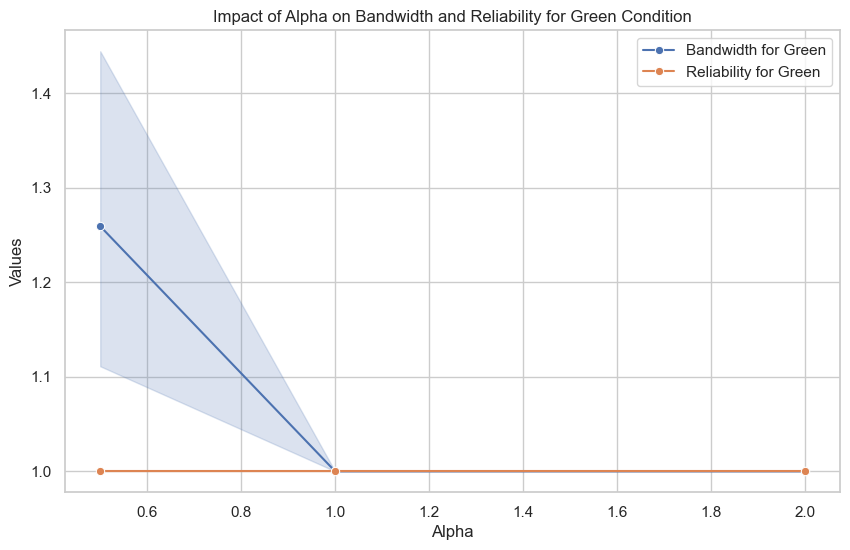

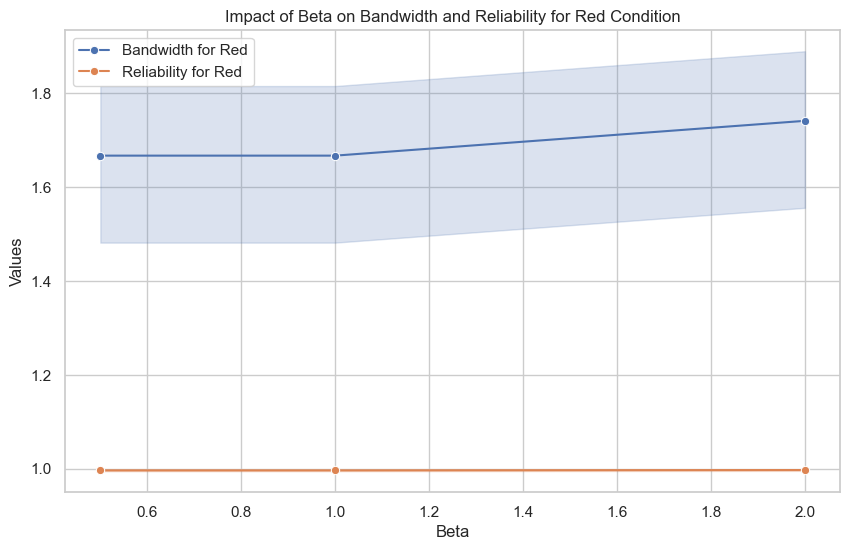

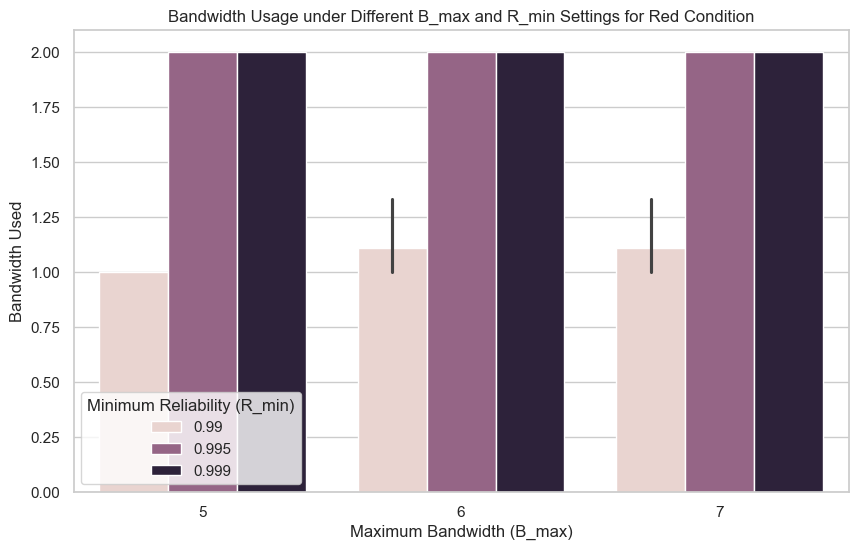

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the CSV file into a DataFrame
df = pd.read_csv('sensitivity_analysis_results.csv')

# Set the style of seaborn
sns.set(style="whitegrid")

# Plotting alpha vs. objective values for different conditions
plt.figure(figsize=(10, 6))
sns.lineplot(x='alpha', y='b_Green', data=df, marker='o', label='Bandwidth for Green')
sns.lineplot(x='alpha', y='r_Green', data=df, marker='o', label='Reliability for Green')
plt.title('Impact of Alpha on Bandwidth and Reliability for Green Condition')
plt.xlabel('Alpha')
plt.ylabel('Values')
plt.legend()
plt.show()

# Plotting beta vs. objective values for different conditions
plt.figure(figsize=(10, 6))
sns.lineplot(x='beta', y='b_Red', data=df, marker='o', label='Bandwidth for Red')
sns.lineplot(x='beta', y='r_Red', data=df, marker='o', label='Reliability for Red')
plt.title('Impact of Beta on Bandwidth and Reliability for Red Condition')
plt.xlabel('Beta')
plt.ylabel('Values')
plt.legend()
plt.show()

# You might also want to compare how different settings of B_max affect the results
plt.figure(figsize=(10, 6))
sns.barplot(x='B_max', y='b_Red', data=df, hue='R_min')
plt.title('Bandwidth Usage under Different B_max and R_min Settings for Red Condition')
plt.xlabel('Maximum Bandwidth (B_max)')
plt.ylabel('Bandwidth Used')
plt.legend(title='Minimum Reliability (R_min)')
plt.show()


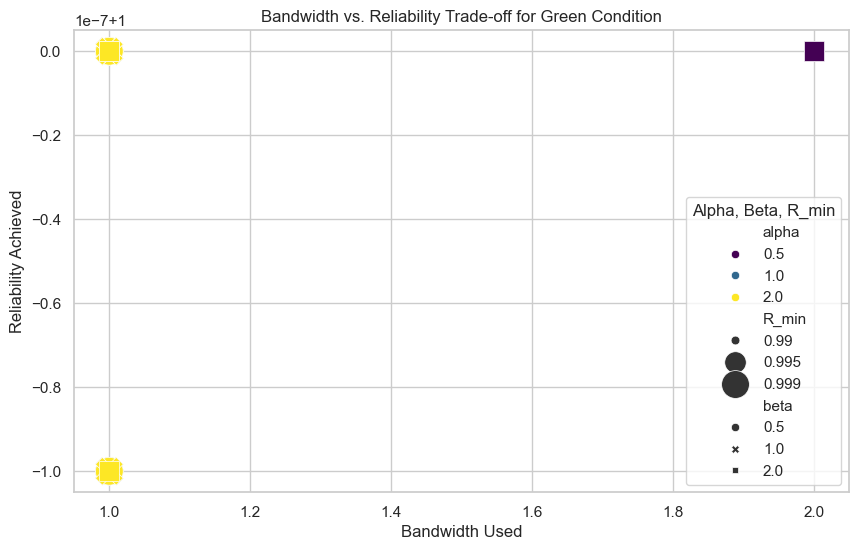

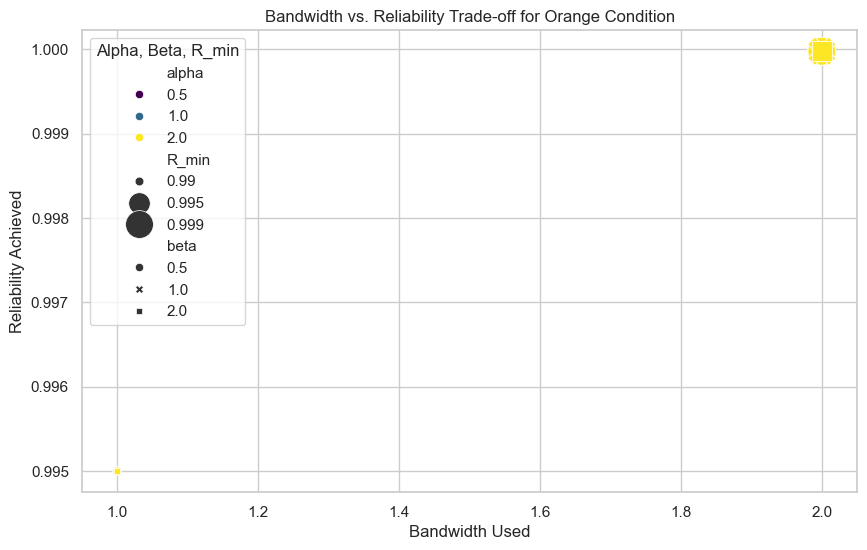

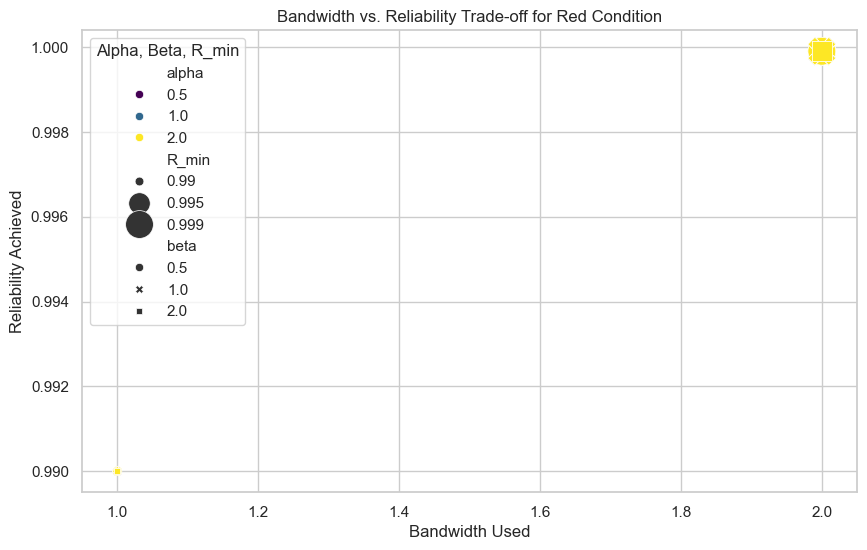

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df = pd.read_csv('sensitivity_analysis_results.csv')

# Set up the plotting style
sns.set(style="whitegrid")

# Create scatter plots for each condition
for condition in ['Green', 'Orange', 'Red']:
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=df, x=f'b_{condition}', y=f'r_{condition}', hue='alpha', style='beta', size='R_min', sizes=(40, 400), palette='viridis')
    plt.title(f'Bandwidth vs. Reliability Trade-off for {condition} Condition')
    plt.xlabel('Bandwidth Used')
    plt.ylabel('Reliability Achieved')
    plt.legend(title='Alpha, Beta, R_min')
    plt.grid(True)
    plt.show()


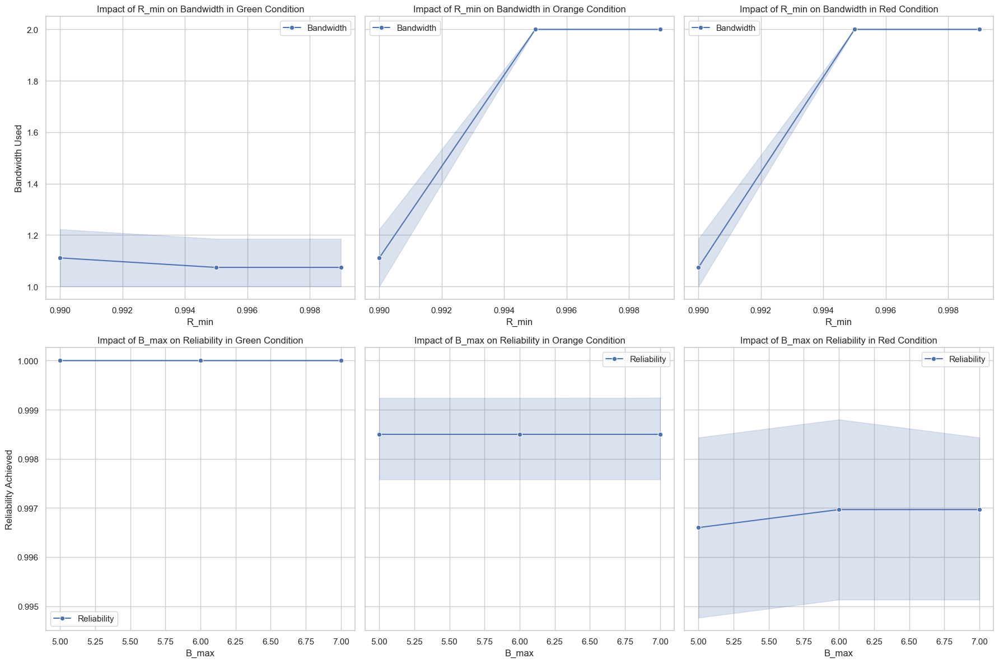

In [ ]:
# Plotting the effect of changing R_min and B_max on the Bandwidth and Reliability
fig, axes = plt.subplots(2, 3, figsize=(18, 12), sharey='row')  # 2 rows for bandwidth and reliability, 3 columns for each condition
axes = axes.flatten()

for i, condition in enumerate(['Green', 'Orange', 'Red']):
    sns.lineplot(data=df, x='R_min', y=f'b_{condition}', ax=axes[i], marker='o', label='Bandwidth')
    axes[i].set_title(f'Impact of R_min on Bandwidth in {condition} Condition')
    axes[i].set_xlabel('R_min')
    axes[i].set_ylabel('Bandwidth Used')

    sns.lineplot(data=df, x='B_max', y=f'r_{condition}', ax=axes[i+3], marker='o', label='Reliability')
    axes[i+3].set_title(f'Impact of B_max on Reliability in {condition} Condition')
    axes[i+3].set_xlabel('B_max')
    axes[i+3].set_ylabel('Reliability Achieved')

plt.tight_layout()
plt.show()


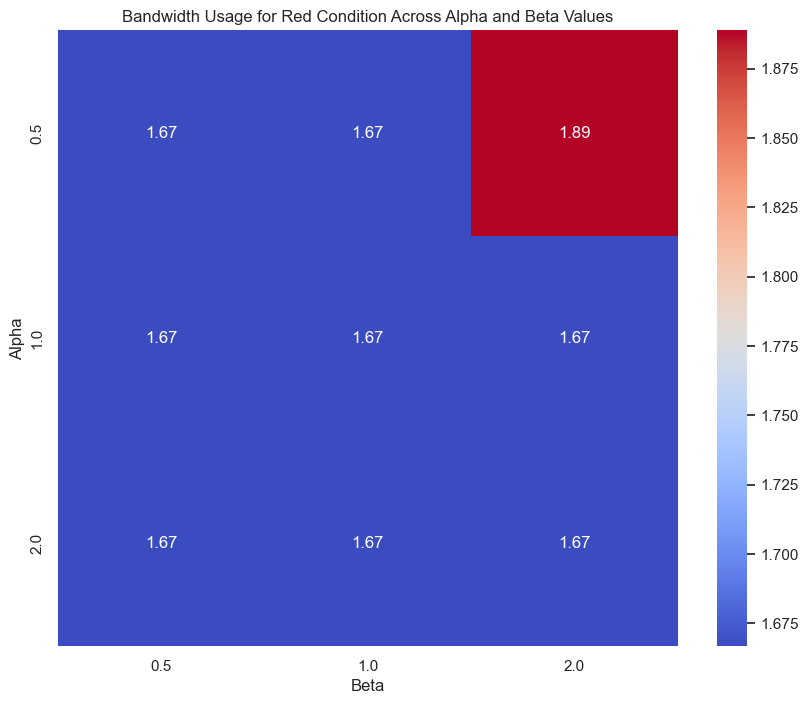

In [ ]:
# Heatmap of bandwidth usage for different alpha and beta values in a specific condition
pivot_table_df = df.pivot_table(index='alpha', columns='beta', values='b_Red', aggfunc='mean')
plt.figure(figsize=(10, 8))
sns.heatmap(pivot_table_df, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Bandwidth Usage for Red Condition Across Alpha and Beta Values')
plt.xlabel('Beta')
plt.ylabel('Alpha')
plt.show()


C:\Users\emohaub\AppData\Local\Temp\ipykernel_8520\4293876363.py:13: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=df, x='alpha', y='y_Green', hue='beta', palette='coolwarm', ci=None)


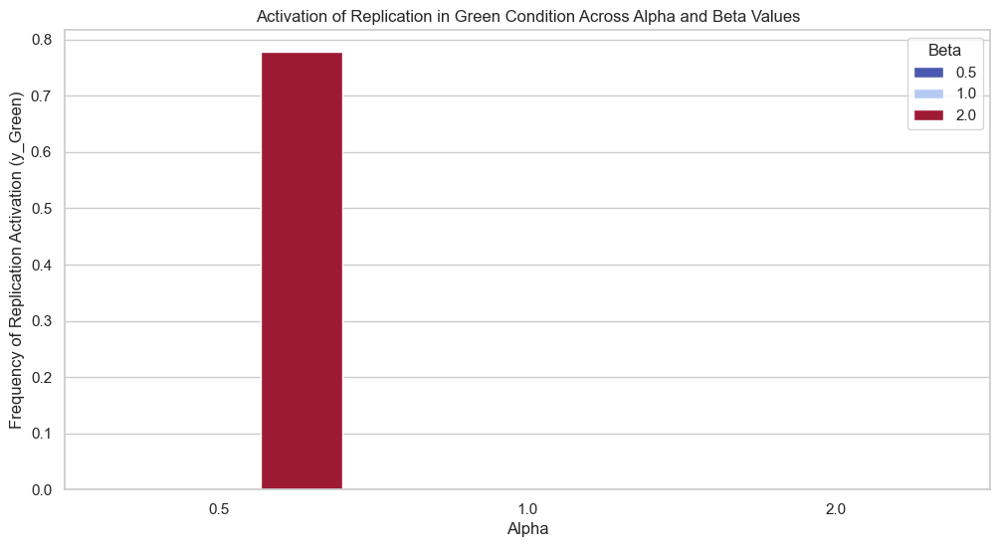

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df = pd.read_csv('sensitivity_analysis_results.csv')

# Set up the plotting style
sns.set(style="whitegrid")

# Create bar plots for decision variable y across conditions
plt.figure(figsize=(12, 6))
sns.barplot(data=df, x='alpha', y='y_Green', hue='beta', palette='coolwarm', ci=None)
plt.title('Activation of Replication in Green Condition Across Alpha and Beta Values')
plt.xlabel('Alpha')
plt.ylabel('Frequency of Replication Activation (y_Green)')
plt.legend(title='Beta')
plt.show()

# Repeat for Orange and Red conditions as needed


In [ ]:
# Assuming you have different scenarios for p_w saved in your CSV with corresponding labels
plt.figure(figsize=(12, 6))
sns.lineplot(data=df, x='p_w_Red', y='b_Red', label='Bandwidth')
sns.lineplot(data=df, x='p_w_Red', y='r_Red', label='Reliability', color='red')
plt.title('Impact of Packet Loss Probability (Red) on Bandwidth and Reliability')
plt.xlabel('Packet Loss Probability (Red)')
plt.ylabel('Metric Value')
plt.legend()
plt.show()


ValueError: Could not interpret value `p_w_Red` for `x`. An entry with this name does not appear in `data`.

<Figure size 1200x600 with 0 Axes>

In [ ]:
import plotly.express as px

# Load the data
df = pd.read_csv('sensitivity_analysis_results.csv')

# Create an interactive scatter plot for bandwidth and reliability
fig = px.scatter(df, x='b_Red', y='r_Red', color='alpha', size='beta',
                 hover_data=['R_min', 'B_max'], title='Interactive Analysis of Bandwidth vs. Reliability in Red Condition')
fig.update_layout(xaxis_title='Bandwidth', yaxis_title='Reliability')
fig.show()



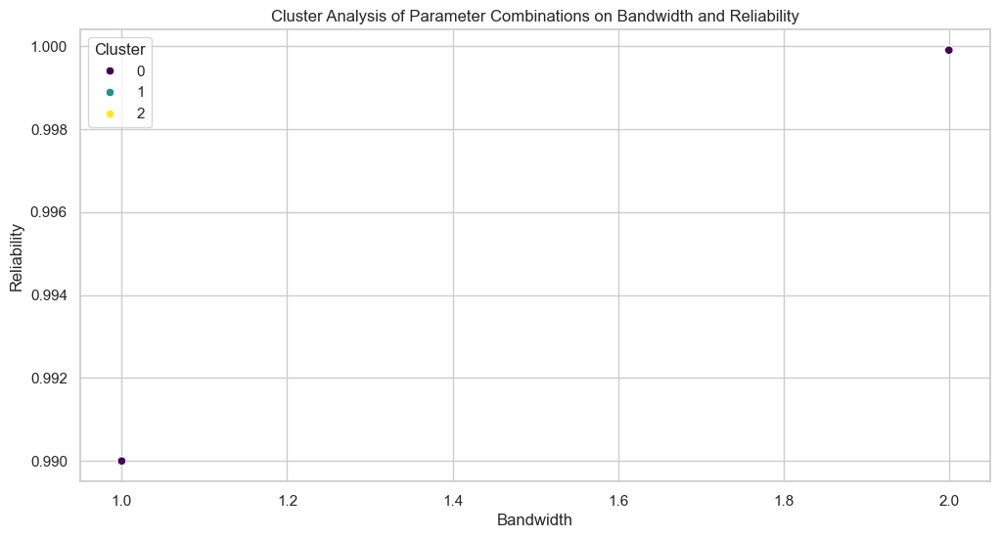

In [ ]:
from sklearn.cluster import KMeans
import numpy as np

# Assume df is your DataFrame loaded from CSV
features = df[['alpha', 'beta', 'R_min', 'B_max', 'b_Red', 'r_Red']]
kmeans = KMeans(n_clusters=3, random_state=0).fit(features)
df['Cluster'] = kmeans.labels_

# Plotting
plt.figure(figsize=(12, 6))
sns.scatterplot(data=df, x='b_Red', y='r_Red', hue='Cluster', palette='viridis')
plt.title('Cluster Analysis of Parameter Combinations on Bandwidth and Reliability')
plt.xlabel('Bandwidth')
plt.ylabel('Reliability')
plt.legend(title='Cluster')
plt.show()


<Figure size 1200x800 with 0 Axes>

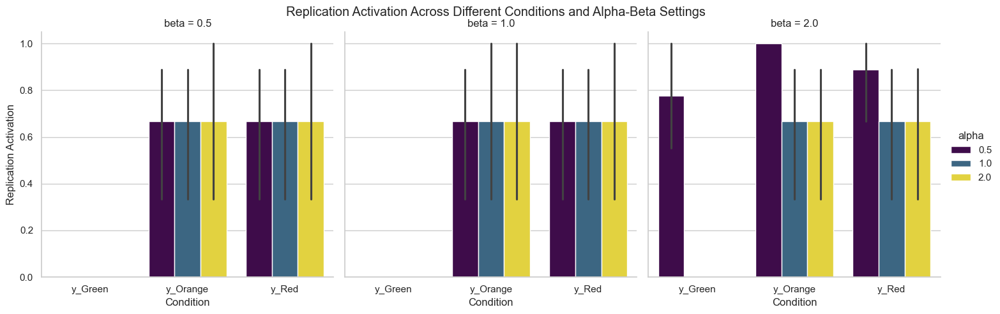

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df = pd.read_csv('sensitivity_analysis_results.csv')

# Prepare a melted version of the data for plotting
df_melted = df.melt(id_vars=['alpha', 'beta', 'R_min', 'B_max'], value_vars=['y_Green', 'y_Orange', 'y_Red'], var_name='Condition', value_name='Replication Activation')

# Plot
plt.figure(figsize=(12, 8))
sns.catplot(x='Condition', y='Replication Activation', hue='alpha', col='beta', kind='bar', data=df_melted, palette='viridis')
plt.subplots_adjust(top=0.9)
plt.suptitle('Replication Activation Across Different Conditions and Alpha-Beta Settings')
plt.show()


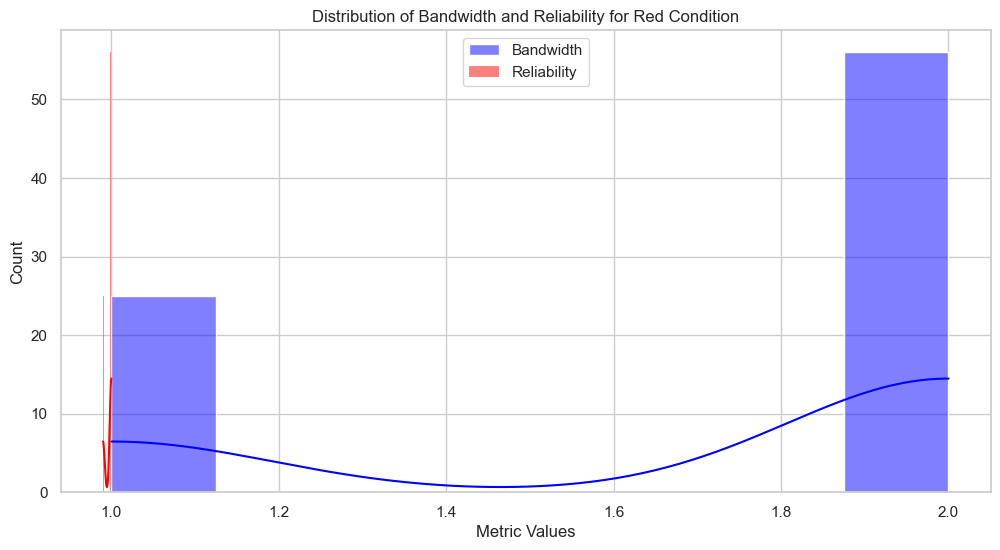

In [ ]:
plt.figure(figsize=(12, 6))
sns.histplot(df, x='b_Red', kde=True, color='blue', label='Bandwidth')
sns.histplot(df, x='r_Red', kde=True, color='red', label='Reliability')
plt.title('Distribution of Bandwidth and Reliability for Red Condition')
plt.xlabel('Metric Values')
plt.legend()
plt.show()



C:\Users\emohaub\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\axisgrid.py:1513: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.

C:\Users\emohaub\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\axisgrid.py:1513: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.

C:\Users\emohaub\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\axisgrid.py:1513: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.

C:\Users\emohaub\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\axisgrid.py:1513: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.

C:\Users\emohaub

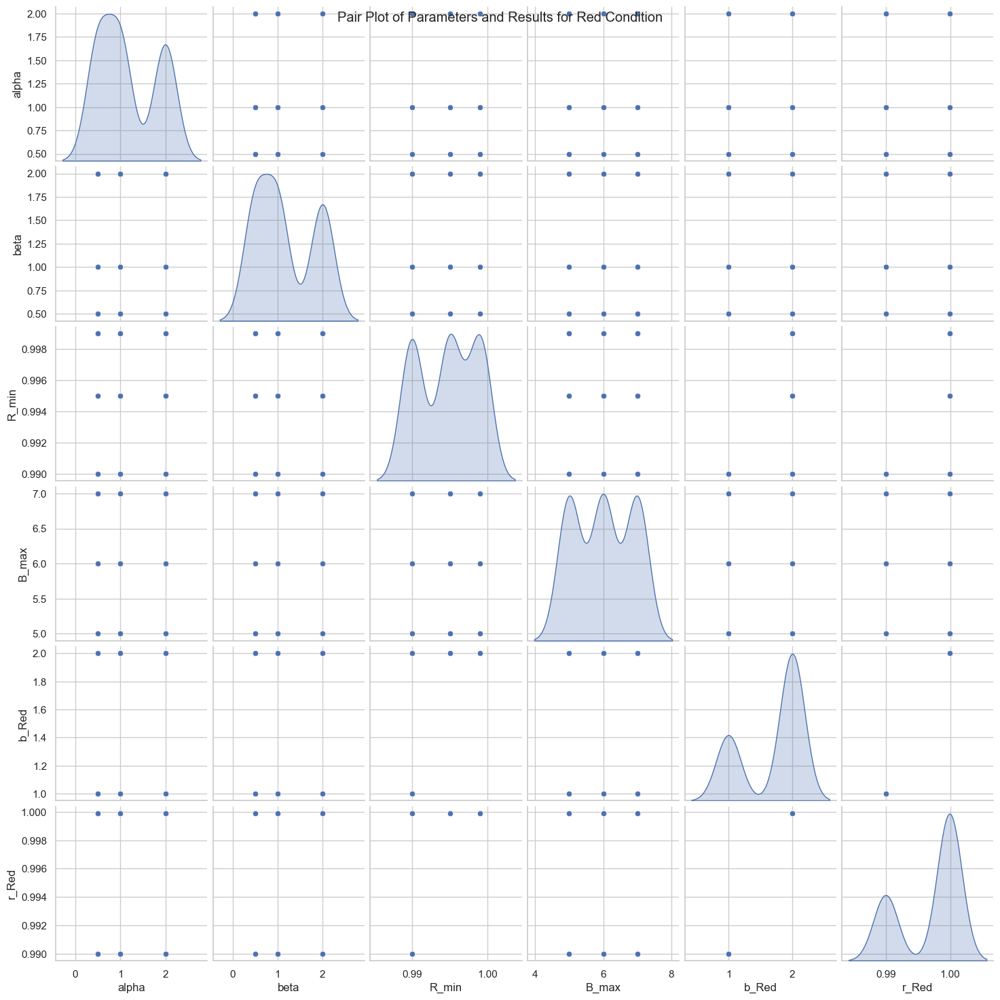

In [ ]:
sns.pairplot(df[['alpha', 'beta', 'R_min', 'B_max', 'b_Red', 'r_Red']], diag_kind='kde', kind='scatter', palette='viridis')
plt.suptitle('Pair Plot of Parameters and Results for Red Condition')
plt.show()


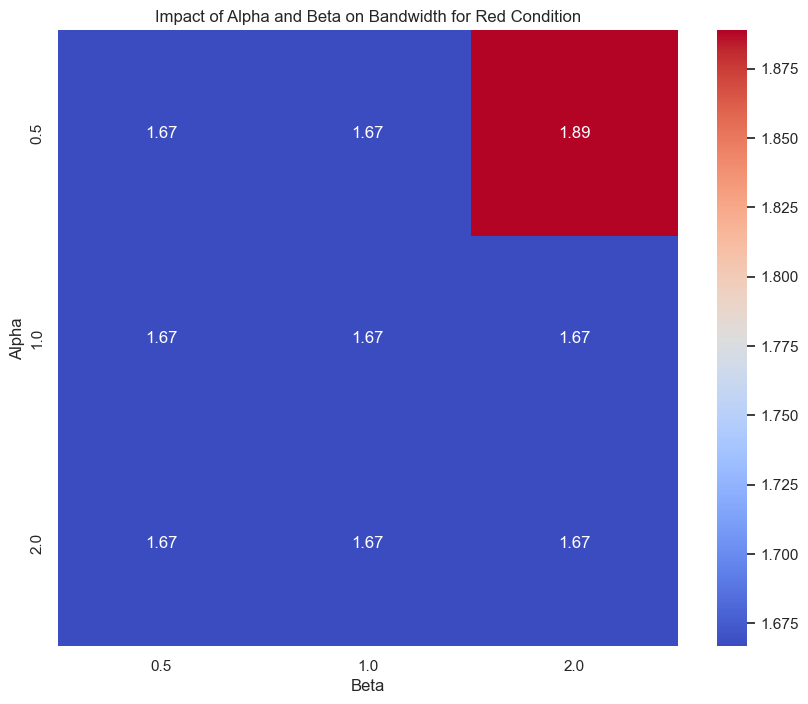

In [ ]:
# Pivot table for creating a heatmap of alpha vs beta on bandwidth for the Red condition
pivot_table_b = df.pivot_table(index='alpha', columns='beta', values='b_Red', aggfunc='mean')

plt.figure(figsize=(10, 8))
sns.heatmap(pivot_table_b, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Impact of Alpha and Beta on Bandwidth for Red Condition')
plt.xlabel('Beta')
plt.ylabel('Alpha')
plt.show()


In [ ]:
# Assuming 'time' is a column representing when measurements were taken
df['time'] = pd.to_datetime(df['time'])  # Convert time column to datetime
df.sort_values('time', inplace=True)  # Sort data by time

plt.figure(figsize=(12, 6))
sns.lineplot(x='time', y='r_Red', data=df, label='Reliability')
sns.lineplot(x='time', y='b_Red', data=df, label='Bandwidth', linestyle='--')
plt.title('Network Performance Over Time for Red Condition')
plt.xlabel('Time')
plt.ylabel('Performance Metrics')
plt.legend()
plt.show()


KeyError: 'time'

In [ ]:
from gurobipy import Model, GRB, quicksum

# Initialize model
m = Model("network_optimization")

# Define parameters
p_wireline = 0.00
b = {"high": 1.0, "medium": 1.5, "low": 2.0}
p_wireless = {"high": 0.05, "medium": 0.15, "low": 0.20}
alpha = 1.0  # Weight for bandwidth
beta = 1.0   # Weight for reliability
B_max = 5.0  # Increased maximum bandwidth

# Define decision variables
x = {i: m.addVar(vtype=GRB.BINARY, name=f"x_{i}") for i in p_wireless.keys()}

# Set objective function
m.setObjective(alpha * quicksum(b[i] * x[i] for i in b.keys()) -
               beta * quicksum((1 - (1 - (1 - p_wireless[i]) * (1 - p_wireline**2))**2) * x[i] for i in p_wireless.keys()),
               GRB.MINIMIZE)

# Add constraints
m.addConstr(quicksum(b[i] * x[i] for i in b.keys()) <= B_max, "Bandwidth_Limit")

for i in p_wireless.keys():
    r_k = 1 - (1 - (1 - p_wireless[i]) * (1 - p_wireline**2))**2
    m.addConstr(r_k * x[i] >= 0.95, name=f"reliability_{i}")

# Optimize the model
m.optimize()

# Output results
if m.status == GRB.OPTIMAL:
    for i in x.keys():
        print(f"Activate reliability functions for {i} signal quality: {x[i].X}")
else:
    print("Model is infeasible or there's another issue.")



# Check if the model is infeasible
if m.status == GRB.INFEASIBLE:
    print("Model is infeasible; computing IIS")
    m.computeIIS()  # Identify and print the irreducible inconsistent subsystem
    m.write("model.ilp")
    print("IIS written to file 'model.ilp'")
else:
    for i in x.keys():
        print(f"Activate reliability functions for {i} signal quality: {x[i].X}")



Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-03
Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (win64 - Windows 10.0 (19045.2))

CPU model: 11th Gen Intel(R) Core(TM) i5-1145G7 @ 2.60GHz, instruction set [SSE2|AVX|AVX2|AVX512]
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 4 rows, 3 columns and 6 nonzeros
Model fingerprint: 0x9f281022
Variable types: 0 continuous, 3 integer (3 binary)
Coefficient statistics:
  Matrix range     [1e+00, 2e+00]
  Objective range  [3e-03, 1e+00]
  Bounds range     [1e+00, 1e+00]
  RHS range        [5e+00, 5e+00]
Found heuristic solution: objective 0.0000000

Explored 0 nodes (0 simplex iterations) in 0.01 seconds (0.00 work units)
Thread count was 1 (of 8 available processors)

Solution count 1: 0 

Optimal solution found (tolerance 1.00e-04)
Best objective 0.000000000000e+00, best bound 0.000000000000e+00, gap 0.0000%
Activate reliability functions for high signal quality: -0.0
Acti

In [ ]:
from gurobipy import Model, GRB, quicksum

# Initialize model
m = Model("network_optimization")

# Define parameters
p_wireline = 0.01
b = {"high": 1.0, "medium": 1.5, "low": 2.0}
p_wireless = {"high": 0.0, "medium": 0.15, "low": 0.20}
alpha = 1.0  # Weight for bandwidth
beta = 1.0   # Weight for reliability
B_max = 5.0  # Increased maximum bandwidth

# Define decision variables
x = {i: m.addVar(vtype=GRB.BINARY, name=f"x_{i}") for i in p_wireless.keys()}

# Set objective function
m.setObjective(alpha * quicksum(b[i] * x[i] for i in b.keys()) -
               beta * quicksum((1 - (1 - (1 - p_wireless[i]) * (1 - p_wireline**2))**2) * x[i] for i in p_wireless.keys()),
               GRB.MINIMIZE)

# Add constraints
m.addConstr(quicksum(b[i] * x[i] for i in b.keys()) <= B_max, "Bandwidth_Limit")

for i in p_wireless.keys():
    r_k = 1 - (1 - (1 - p_wireless[i]) * (1 - p_wireline**2))**2
    m.addConstr(r_k * x[i] >= 0.95, name=f"reliability_{i}")

# Optimize the model
m.optimize()

# Output results
if m.status == GRB.OPTIMAL:
    for i in x.keys():
        print(f"Activate reliability functions for {i} signal quality: {x[i].X}")
else:
    print("Model is infeasible or there's another issue.")



# Check if the model is infeasible
if m.status == GRB.INFEASIBLE:
    print("Model is infeasible; computing IIS")
    m.computeIIS()  # Identify and print the irreducible inconsistent subsystem
    m.write("model.ilp")
    print("IIS written to file 'model.ilp'")
else:
    for i in x.keys():
        print(f"Activate reliability functions for {i} signal quality: {x[i].X}")



Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (win64 - Windows 10.0 (19045.2))

CPU model: 11th Gen Intel(R) Core(TM) i5-1145G7 @ 2.60GHz, instruction set [SSE2|AVX|AVX2|AVX512]
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 4 rows, 3 columns and 6 nonzeros
Model fingerprint: 0x30017a10
Variable types: 0 continuous, 3 integer (3 binary)
Coefficient statistics:
  Matrix range     [1e+00, 2e+00]
  Objective range  [1e-08, 1e+00]
  Bounds range     [1e+00, 1e+00]
  RHS range        [9e-01, 5e+00]
Found heuristic solution: objective 1.5625575
Presolve removed 4 rows and 3 columns
Presolve time: 0.00s
Presolve: All rows and columns removed

Explored 0 nodes (0 simplex iterations) in 0.01 seconds (0.00 work units)
Thread count was 1 (of 8 available processors)

Solution count 1: 1.56256 

Optimal solution found (tolerance 1.00e-04)
Best objective 1.562557523625e+00, best bound 1.562557523625e+00, gap 0.0000%
Activate reliability function

In [ ]:
from gurobipy import Model, GRB, quicksum

# Initialize model
m = Model("network_optimization")

# Define parameters
p_wireline = 0.01
b = {"high": 2.0, "medium": 1.5, "low": 2.0}
p_wireless = {"high": 0.0, "medium": 0.15, "low": 0.20}
alpha = 1.0  # Weight for bandwidth
beta = {"high": 5.0, "medium": 1.0, "low": 1.0}  # Increased penalty for high quality
B_max = 6.0  # Further increased maximum bandwidth for testing
R_min = {"high": 0, "medium": 0.95, "low": 0.95}  # Further lowered R_min for high quality

# Define decision variables
x = {i: m.addVar(vtype=GRB.BINARY, name=f"x_{i}") for i in p_wireless.keys()}

# Set objective function
m.setObjective(alpha * quicksum(b[i] * x[i] for i in b.keys()) -
               quicksum(beta[i] * (1 - (1 - (1 - p_wireless[i]) * (1 - p_wireline**2))**2) * x[i] for i in p_wireless.keys()),
               GRB.MINIMIZE)

# Add constraints
m.addConstr(quicksum(b[i] * x[i] for i in b.keys()) <= B_max, "Bandwidth_Limit")

for i in p_wireless.keys():
    r_k = 1 - (1 - (1 - p_wireless[i]) * (1 - p_wireline**2))**2
    m.addConstr(r_k * x[i] >= R_min[i], name=f"reliability_{i}")

# Optimize the model
m.optimize()

# Check and analyze the results
if m.status == GRB.OPTIMAL:
    for i in x.keys():
        print(f"Activate reliability functions for {i} signal quality: {x[i].X}")
elif m.status == GRB.INFEASIBLE:
    print("Model is infeasible; computing IIS")
    m.computeIIS()  # Identify and print the irreducible inconsistent subsystem
    m.write("model.ilp")
    print("IIS written to file 'model.ilp'")
else:
    print("Model has another issue.")


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (win64 - Windows 10.0 (19045.2))

CPU model: 11th Gen Intel(R) Core(TM) i5-1145G7 @ 2.60GHz, instruction set [SSE2|AVX|AVX2|AVX512]
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 4 rows, 3 columns and 6 nonzeros
Model fingerprint: 0xb13bb324
Variable types: 0 continuous, 3 integer (3 binary)
Coefficient statistics:
  Matrix range     [1e+00, 2e+00]
  Objective range  [5e-01, 3e+00]
  Bounds range     [1e+00, 1e+00]
  RHS range        [9e-01, 6e+00]
Found heuristic solution: objective -1.4374424
Presolve removed 4 rows and 3 columns
Presolve time: 0.00s
Presolve: All rows and columns removed

Explored 0 nodes (0 simplex iterations) in 0.01 seconds (0.00 work units)
Thread count was 1 (of 8 available processors)

Solution count 1: -1.43744 
No other solutions better than -1.43744

Optimal solution found (tolerance 1.00e-04)
Best objective -1.437442436375e+00, best bound -1.437442436375e+0

In [ ]:
from gurobipy import Model, GRB, quicksum

# Initialize model
m = Model("network_optimization")

# Define parameters
p_wireline = 0.00
b = {"high": 1.0, "medium": 2, "low": 2.0}  # Cost of activating reliability functions
p_wireless = {"high": 0.0, "medium": 0.15, "low": 0.20}
alpha = 1.0  # Weight for bandwidth
beta = {"high": 1.0, "medium": 1.0, "low": 1.0}  # Penalty for activating reliability functions
B_max = 6.0  # Maximum bandwidth
R_min = {"high": 0.001, "medium": 0.95, "low": 0.50}  # Specific reliability requirements

# Define decision variables
x = {i: m.addVar(vtype=GRB.BINARY, name=f"x_{i}") for i in p_wireless.keys()}

# Set objective function
m.setObjective(alpha * quicksum(b[i] * x[i] for i in b.keys()) -
               quicksum(beta[i] * (1 - (1 - (1 - p_wireless[i]) * (1 - p_wireline**2))**2) * x[i] for i in p_wireless.keys()),
               GRB.MINIMIZE)

# Add constraints
m.addConstr(quicksum(b[i] * x[i] for i in b.keys()) <= B_max, "Bandwidth_Limit")

for i in p_wireless.keys():
    r_k = 1 - (1 - (1 - p_wireless[i]) * (1 - p_wireline**2))**2
    m.addConstr(r_k * x[i] >= R_min[i], name=f"reliability_{i}")

# Optimize the model
m.optimize()

# Output results
if m.status == GRB.OPTIMAL:
    for i in x.keys():
        if i == "high":
            if x[i].X < 0.5:
                print(f"Deactivate reliability functions for high signal quality.")
            else:
                print(f"Activate reliability functions for high signal quality.")
        else:
            if x[i].X < 0.5:
                print(f"Deactivate reliability functions for {i} signal quality.")
            else:
                print(f"Activate reliability functions for {i} signal quality.")
else:
    print("Model is infeasible or there's another issue.")


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (win64 - Windows 10.0 (19045.2))

CPU model: 11th Gen Intel(R) Core(TM) i5-1145G7 @ 2.60GHz, instruction set [SSE2|AVX|AVX2|AVX512]
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 4 rows, 3 columns and 6 nonzeros
Model fingerprint: 0xd2032404
Variable types: 0 continuous, 3 integer (3 binary)
Coefficient statistics:
  Matrix range     [1e+00, 2e+00]
  Objective range  [1e+00, 1e+00]
  Bounds range     [1e+00, 1e+00]
  RHS range        [5e-01, 6e+00]
Found heuristic solution: objective 2.0625000
Presolve removed 4 rows and 3 columns
Presolve time: 0.00s
Presolve: All rows and columns removed

Explored 0 nodes (0 simplex iterations) in 0.01 seconds (0.00 work units)
Thread count was 1 (of 8 available processors)

Solution count 1: 2.0625 

Optimal solution found (tolerance 1.00e-04)
Best objective 2.062500000000e+00, best bound 2.062500000000e+00, gap 0.0000%
Deactivate reliability functio

In [ ]:
from gurobipy import Model, GRB, quicksum

# Initialize model
m = Model("network_optimization")

# Define parameters
p_wireline = 0.00  # Assuming perfect wireline conditions
p_wireless = {"high": 0.001, "medium": 0.01, "low": 0.1}  # Packet loss probabilities for wireless



b = {"high": 1.0, "medium": 2.0, "low": 2.0}  # Costs for activating reliability functions
alpha = 1.0  # Cost factor for activating reliability functions

beta = {"high": 1.0, "medium": 1.0, "low": 1.0}  # Benefits of reliability

B_max = 6.0  # Maximum allowable bandwidth

R_min = {"high": 0.0, "medium": 0.90, "low": 0.90}  # Minimum reliability requirements

# Define decision variables
x = {i: m.addVar(vtype=GRB.BINARY, name=f"x_{i}") for i in p_wireless.keys()}

# Calculate reliability for each condition
r = {
    i: 1 - (1 - (1 - p_wireless[i]) * (1 - p_wireline**2))**2
    for i in p_wireless.keys()
}

print(f"reliability for each condition, {r}")

# Set objective function
m.setObjective(
    alpha * quicksum(b[i] * x[i] for i in b.keys()) -
    quicksum(beta[i] * r[i] * x[i] for i in r.keys()),
    GRB.MINIMIZE
)

# Add constraints
m.addConstr(quicksum(b[i] * x[i] for i in b.keys()) <= B_max, "Bandwidth_Limit")
for i in p_wireless.keys():
    m.addConstr(r[i] * x[i] >= R_min[i], name=f"reliability_{i}")

# Optimize the model
m.optimize()

# Output results
if m.status == GRB.OPTIMAL:
    for i in x.keys():
        activation_status = "Activate" if x[i].X > 0.5 else "Deactivate"
        print(f"{activation_status} reliability functions for {i} signal quality, {x[i].X}")
else:
    print("Model is infeasible or there's another issue.")


reliability for each condition, {'high': 0.999999, 'medium': 0.9999, 'low': 0.99}
Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (win64 - Windows 10.0 (19045.2))

CPU model: 11th Gen Intel(R) Core(TM) i5-1145G7 @ 2.60GHz, instruction set [SSE2|AVX|AVX2|AVX512]
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 4 rows, 3 columns and 6 nonzeros
Model fingerprint: 0x7acc0c64
Variable types: 0 continuous, 3 integer (3 binary)
Coefficient statistics:
  Matrix range     [1e+00, 2e+00]
  Objective range  [1e-06, 1e+00]
  Bounds range     [1e+00, 1e+00]
  RHS range        [9e-01, 6e+00]
Found heuristic solution: objective 2.0101000
Presolve removed 4 rows and 3 columns
Presolve time: 0.00s
Presolve: All rows and columns removed

Explored 0 nodes (0 simplex iterations) in 0.01 seconds (0.00 work units)
Thread count was 1 (of 8 available processors)

Solution count 1: 2.0101 

Optimal solution found (tolerance 1.00e-04)
Best objective 2.010100000